In [379]:
import os
# import colabdesign
# from colabdesign.mpnn import mk_mpnn_model, clear_mem
# from colabdesign.shared.protein import pdb_to_string
os.chdir('/home/jupyter-yehlin/')
import os
# import colabdesign
# from colabdesign.mpnn import mk_mpnn_model, clear_mem
# from colabdesign.shared.protein import pdb_to_string
os.chdir('/home/jupyter-yehlin/DMSV2/dataset_final/ESMFold_dist')


import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
import pandas as pd
import tqdm.notebook
import seaborn
import re, tempfile
# from colabdesign.af.contrib import predictz
# from colabdesign.shared.protein import _np_rmsd

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats


In [3]:
pwd

'/home/jupyter-yehlin/DMSV2/dataset_final/ESMFold_dist'

## 1. TrROS struct  * ESMFold distogram

In [81]:
df_half_maked = pd.read_csv('all_4_half_masked_seq_CE_total.csv')

In [82]:
df_full = pd.read_csv('all_4_full_seq_CE.csv')

In [83]:
import ast

# Convert the string representation of lists to actual lists
df_half_maked['log_CE'] = df_half_maked['log_CE'].apply(ast.literal_eval)
df_half_maked['CE'] = df_half_maked['CE'].apply(ast.literal_eval)
df_half_maked['PLDDT'] = df_half_maked['PLDDT'].apply(ast.literal_eval)
df_half_maked['PTM'] = df_half_maked['PTM'].apply(ast.literal_eval)

In [84]:
df_merged =pd.read_csv('/home/gridsan/ylcho/DMSV2/dataset_final/all_4_AF_plddt70_inter_pae_015.csv')
merged_df = df_merged.merge(df_half_maked[['name', 'log_CE', 'CE', 'PLDDT', 'PTM']], on='name', how='left')
merged_df = merged_df.merge(df_full[['name', 'log_CE', 'CE', 'PLDDT', 'PTM']], on='name', how='left')
merged_df['Half Masked ESMFold Plddt'] = merged_df['Half Masked ESMFold Plddt'].apply(ast.literal_eval)
merged_df[['ID', 'method']] = merged_df['name'].apply(lambda x: pd.Series(["_".join(x.split("_")[:2]), "_".join(x.split("_")[2:])]))

In [85]:
column_replacements = {
    'log_CE_x': 'log_CE_mask',
    'CE_x': 'CE_mask',
    'PLDDT_x': 'PLDDT_mask',
    'PTM_x': 'PTM_mask'
}

# Rename the columns in merged_df
merged_df = merged_df.rename(columns=column_replacements)

In [86]:
column_replacements = {
    'log_CE_y': 'log_CE_full',
    'CE_y': 'CE_full',
    'PLDDT_y': 'PLDDT_full',
    'PTM_y': 'PTM_full'
}

# Rename the columns in merged_df
merged_df = merged_df.rename(columns=column_replacements)

Pearson Correlation Coefficient: -0.16429929795302714


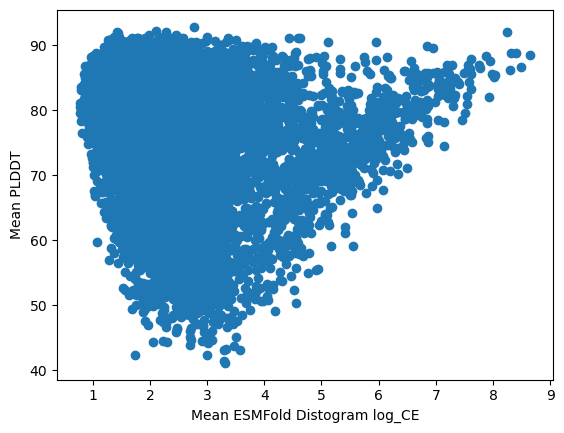

In [87]:
plt.scatter(np.mean(df_half_maked['log_CE'].tolist(), axis=-1), np.mean(df_half_maked['PLDDT'].tolist(), axis=-1))

# Calculate Pearson Correlation Coefficient
correlation_coefficient, p_value = stats.pearsonr(np.mean(df_half_maked['log_CE'].tolist(), axis=-1), np.mean(df_half_maked['PLDDT'].tolist(), axis=-1))
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Add labels for the x and y axes
plt.xlabel('Mean ESMFold Distogram log_CE')
plt.ylabel('Mean PLDDT')

# Show the plot
plt.show()

Pearson Correlation Coefficient: 0.38617452613802516


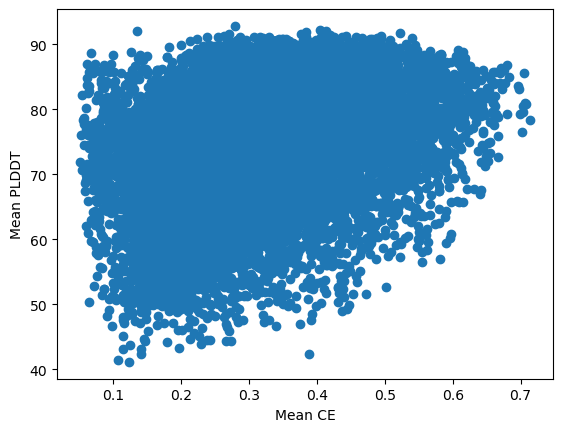

In [88]:
plt.scatter(np.mean(df_half_maked['CE'].tolist(), axis=-1), np.mean(df_half_maked['PLDDT'].tolist(), axis=-1))

# Calculate Pearson Correlation Coefficient
correlation_coefficient, p_value = stats.pearsonr(np.mean(df_half_maked['CE'].tolist(), axis=-1), np.mean(df_half_maked['PLDDT'].tolist(), axis=-1))
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Add labels for the x and y axes
plt.xlabel('Mean CE')
plt.ylabel('Mean PLDDT')

# Show the plot
plt.show()

In [ ]:
merged_df.key

Index(['name', 'sequence', 'Full Seq PLDDT', 'Half Masked ESMFold Plddt',
       'Max Half Masked ESMFold Plddt', 'Half Masked ESMFold Average Plddt',
       'ESM Score', 'AF_plddt', 'inter_pae', 'log10_K50_t', 'log10_K50_t_95CI',
       'log10_K50_c', 'log10_K50_c_95CI', 'deltaG_t', 'deltaG_t_95CI',
       'deltaG_c', 'deltaG_c_95CI', 'deltaG', 'deltaG_95CI',
       'unconditional_CE', 'conditional_CE', 'Hybrid Composite Score',
       'log_CE_mask', 'CE_mask', 'PLDDT_mask', 'PTM_mask', 'log_CE_full',
       'CE_full', 'PLDDT_full', 'PTM_full', 'ID', 'method'],
      dtype='object')

Mean CE for JUSTAS: 0.28709748184329936
Mean CE for TrROS: 0.2690667510389694
Mean CE for TrROS_Hall: 0.28726121448309694
Mean CE for TrMRF: 0.3019855295693756


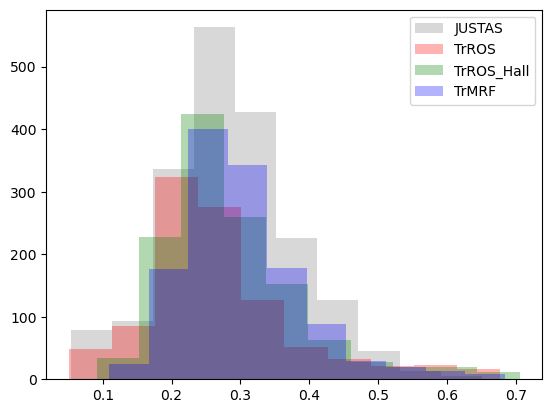

In [94]:
ce_justas = merged_df[merged_df['method'] == 'JUSTAS']['CE_full'].tolist()
ce_trros = merged_df[merged_df['method'] == 'TrROS']['CE_full'].tolist()
ce_trros_hall = merged_df[merged_df['method'] == 'TrROS_Hall']['CE_full'].tolist()
ce_trmrf = merged_df[merged_df['method'] == 'TrMRF']['CE_full'].tolist()

# Calculate mean values
mean_ce_justas = np.mean(ce_justas)
mean_ce_trros = np.mean(ce_trros)
mean_ce_trros_hall = np.mean(ce_trros_hall)
mean_ce_trmrf = np.mean(ce_trmrf)

# Print mean values
print(f"Mean CE for JUSTAS: {mean_ce_justas}")
print(f"Mean CE for TrROS: {mean_ce_trros}")
print(f"Mean CE for TrROS_Hall: {mean_ce_trros_hall}")
print(f"Mean CE for TrMRF: {mean_ce_trmrf}")

# Create histograms
plt.hist(ce_justas, color='gray', alpha=0.3, label='JUSTAS')
plt.hist(ce_trros, color='red', alpha=0.3, label='TrROS')
plt.hist(ce_trros_hall, color='green', alpha=0.3, label='TrROS_Hall')
plt.hist(ce_trmrf, color='blue', alpha=0.3, label='TrMRF')

# Add legend
plt.legend()

# Show the plot
plt.show()

Mean CE for JUSTAS: 2.4062688775750973
Mean CE for TrROS: 2.485049850703692
Mean CE for TrROS_Hall: 2.6048244145109383
Mean CE for TrMRF: 2.0984158539918636


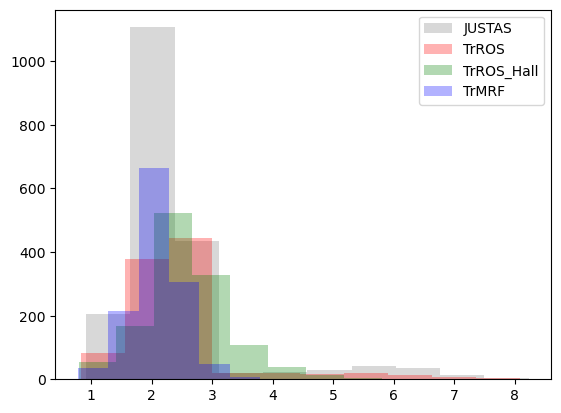

In [95]:
ce_justas = merged_df[merged_df['method'] == 'JUSTAS']['log_CE_full'].tolist()
ce_trros = merged_df[merged_df['method'] == 'TrROS']['log_CE_full'].tolist()
ce_trros_hall = merged_df[merged_df['method'] == 'TrROS_Hall']['log_CE_full'].tolist()
ce_trmrf = merged_df[merged_df['method'] == 'TrMRF']['log_CE_full'].tolist()

# Calculate mean values
mean_ce_justas = np.mean(ce_justas)
mean_ce_trros = np.mean(ce_trros)
mean_ce_trros_hall = np.mean(ce_trros_hall)
mean_ce_trmrf = np.mean(ce_trmrf)

# Print mean values
print(f"Mean CE for JUSTAS: {mean_ce_justas}")
print(f"Mean CE for TrROS: {mean_ce_trros}")
print(f"Mean CE for TrROS_Hall: {mean_ce_trros_hall}")
print(f"Mean CE for TrMRF: {mean_ce_trmrf}")

# Create histograms
plt.hist(ce_justas, color='gray', alpha=0.3, label='JUSTAS')
plt.hist(ce_trros, color='red', alpha=0.3, label='TrROS')
plt.hist(ce_trros_hall, color='green', alpha=0.3, label='TrROS_Hall')
plt.hist(ce_trmrf, color='blue', alpha=0.3, label='TrMRF')

# Add legend
plt.legend()

# Show the plot
plt.show()

## 1-1. ESMFold Distogram CE

Spearman Correlation Coefficient for Method JUSTAS: 0.1545593217206947
Spearman Correlation Coefficient for Method TrMRF: 0.39491137812937016
Spearman Correlation Coefficient for Method TrROS_Hall: 0.2931846402588838
Spearman Correlation Coefficient for Method TrROS: 0.4661595764749077


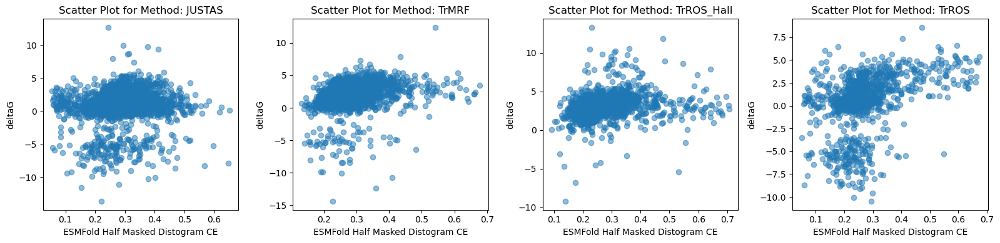

In [76]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = np.mean(subset_df['CE_mask'].tolist(), axis=-1)
    y = subset_df['deltaG'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('ESMFold Half Masked Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: -0.14807975391516445
Spearman Correlation Coefficient for Method TrMRF: -0.34707409284212737
Spearman Correlation Coefficient for Method TrROS_Hall: -0.18155383606141368
Spearman Correlation Coefficient for Method TrROS: -0.4022550760296347


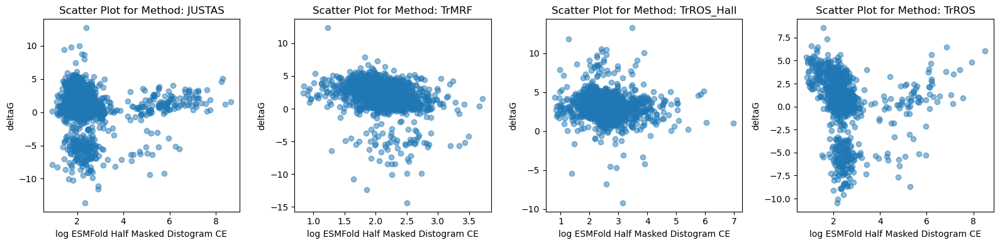

In [77]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = np.mean(subset_df['log_CE_mask'].tolist(), axis=-1)
    y = subset_df['deltaG'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('log ESMFold Half Masked Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: 0.1259934781105905
Spearman Correlation Coefficient for Method TrMRF: 0.4029553383887324
Spearman Correlation Coefficient for Method TrROS_Hall: 0.2996766911562516
Spearman Correlation Coefficient for Method TrROS: 0.4676701698230926


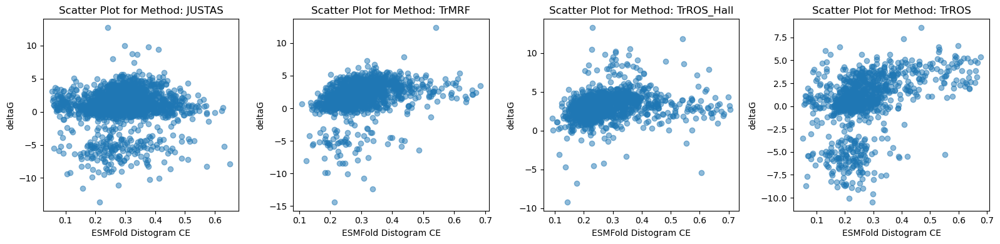

In [30]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = subset_df['CE_full'].tolist()
    y = subset_df['deltaG'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('ESMFold Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: -0.1023956917568981
Spearman Correlation Coefficient for Method TrMRF: -0.31940742876018263
Spearman Correlation Coefficient for Method TrROS_Hall: -0.18450979993546288
Spearman Correlation Coefficient for Method TrROS: -0.4016061056518399


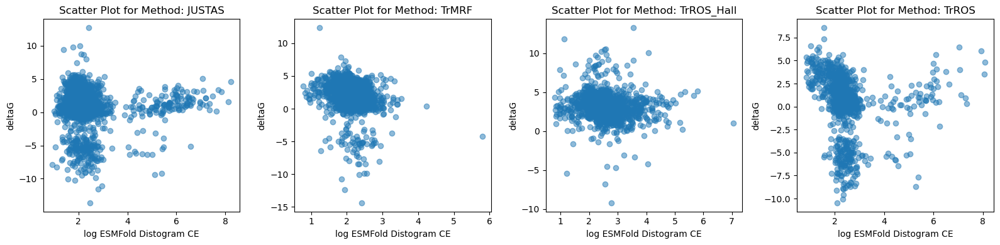

In [79]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x =subset_df['log_CE_full'].tolist()
    y = subset_df['deltaG'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('log ESMFold Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


## 1-2.plddt

Spearman Correlation Coefficient for Method JUSTAS: 0.3760371660662285
Spearman Correlation Coefficient for Method TrMRF: 0.48381427533144933
Spearman Correlation Coefficient for Method TrROS_Hall: 0.4848956948358259
Spearman Correlation Coefficient for Method TrROS: 0.46339229799686515


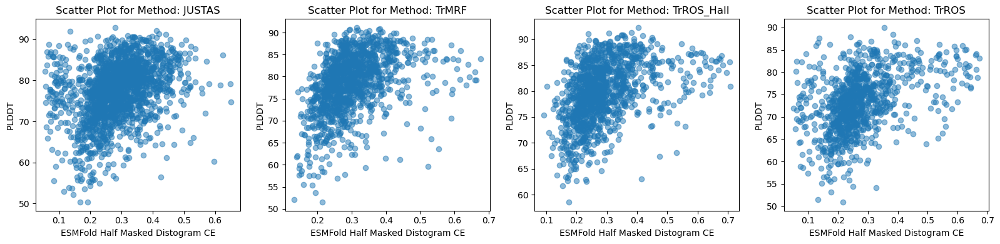

In [33]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = np.mean(subset_df['CE_mask'].tolist(), axis=-1)
    y = np.mean(subset_df['PLDDT_mask'].tolist(), axis=-1)
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('ESMFold Half Masked Distogram CE')
    ax.set_ylabel('PLDDT')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: -0.3903993426862241
Spearman Correlation Coefficient for Method TrMRF: -0.48850234200153303
Spearman Correlation Coefficient for Method TrROS_Hall: -0.2128614409281467
Spearman Correlation Coefficient for Method TrROS: -0.42758354466385895


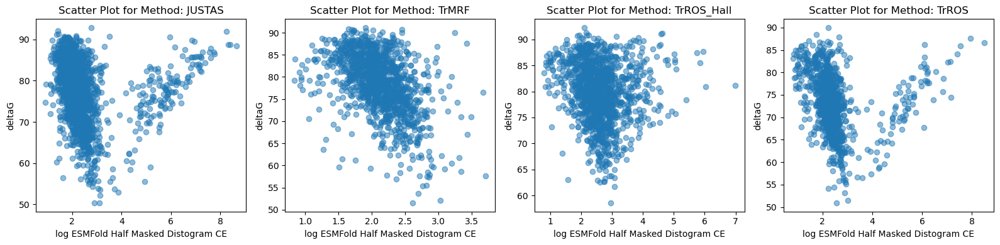

In [34]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = np.mean(subset_df['log_CE_mask'].tolist(), axis=-1)
    y = np.mean(subset_df['PLDDT_mask'].tolist(), axis=-1)
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('log ESMFold Half Masked Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: 0.40740051921192494
Spearman Correlation Coefficient for Method TrMRF: 0.5048797039142287
Spearman Correlation Coefficient for Method TrROS_Hall: 0.49729777903207245
Spearman Correlation Coefficient for Method TrROS: 0.46543788250202756


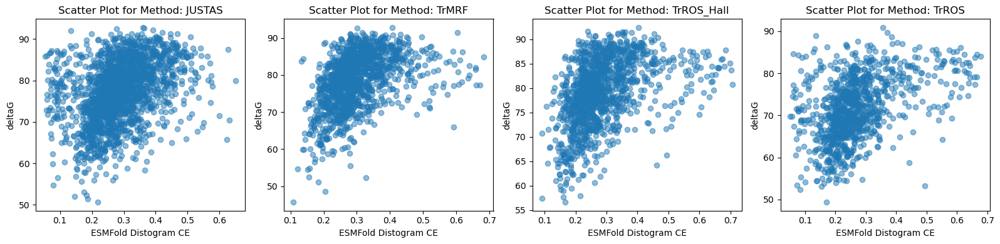

In [35]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = subset_df['CE_full'].tolist()
    y = subset_df['PLDDT_full'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('ESMFold Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: -0.34951797564519105
Spearman Correlation Coefficient for Method TrMRF: -0.4160397854598036
Spearman Correlation Coefficient for Method TrROS_Hall: -0.16274490712572845
Spearman Correlation Coefficient for Method TrROS: -0.3951417451250989


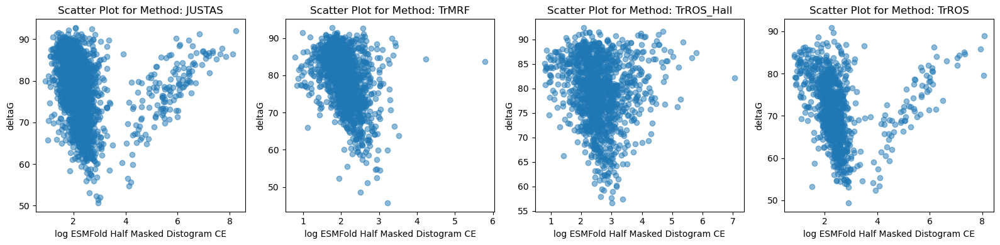

In [36]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x =subset_df['log_CE_full'].tolist()
    y = subset_df['PLDDT_full'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('log ESMFold Half Masked Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Pearson Correlation Coefficient: 0.28535612415000694


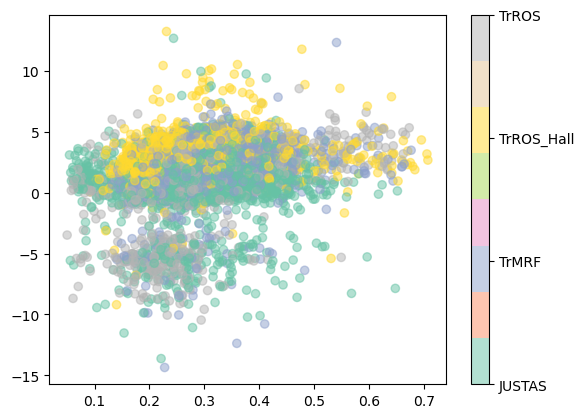

In [38]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Create a scatter plot
plt.scatter(np.mean(merged_df['CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist(), c=method_codes, cmap='Set2', alpha = 0.5)

# Add a colorbar with method labels
cbar = plt.colorbar()
cbar.set_ticks(np.arange(len(method_labels)))
cbar.set_ticklabels(method_labels)

# Calculate Pearson correlation coefficient
correlation_coefficient, p_value = stats.spearmanr(np.mean(merged_df['CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist())
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Show the plot
plt.show()


Pearson Correlation Coefficient: 0.2815011275824307


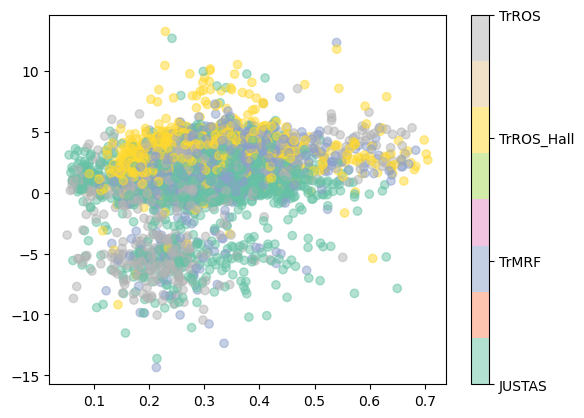

In [39]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Create a scatter plot
plt.scatter(merged_df['CE_full'], merged_df['deltaG'].tolist(), c=method_codes, cmap='Set2', alpha = 0.5)

# Add a colorbar with method labels
cbar = plt.colorbar()
cbar.set_ticks(np.arange(len(method_labels)))
cbar.set_ticklabels(method_labels)

# Calculate Pearson correlation coefficient
correlation_coefficient, p_value = stats.spearmanr(merged_df['CE_full'], merged_df['deltaG'].tolist())
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Show the plot
plt.show()


Pearson Correlation Coefficient: -0.14325346633688416


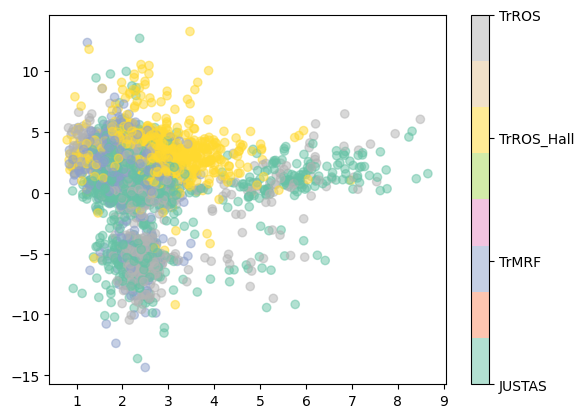

In [40]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Create a scatter plot
plt.scatter(np.mean(merged_df['log_CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist(), c=method_codes, cmap='Set2', alpha = 0.5)

# Add a colorbar with method labels
cbar = plt.colorbar()
cbar.set_ticks(np.arange(len(method_labels)))
cbar.set_ticklabels(method_labels)

# Calculate Pearson correlation coefficient
correlation_coefficient, p_value = stats.spearmanr(np.mean(merged_df['log_CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist())
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Show the plot
plt.show()


Pearson Correlation Coefficient: -0.12345795623697628


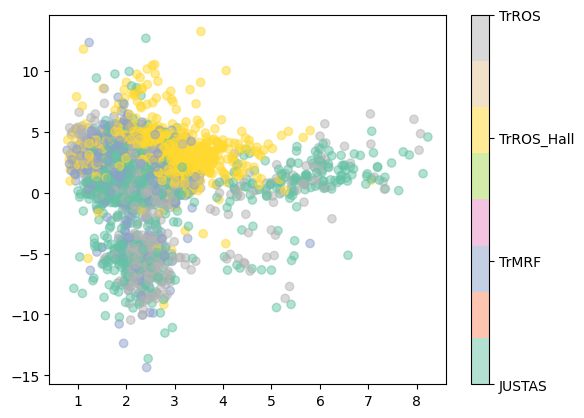

In [41]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Create a scatter plot
plt.scatter(merged_df['log_CE_full'], merged_df['deltaG'].tolist(), c=method_codes, cmap='Set2', alpha = 0.5)

# Add a colorbar with method labels
cbar = plt.colorbar()
cbar.set_ticks(np.arange(len(method_labels)))
cbar.set_ticklabels(method_labels)

# Calculate Pearson correlation coefficient
correlation_coefficient, p_value = stats.spearmanr(merged_df['log_CE_full'], merged_df['deltaG'].tolist())
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Show the plot
plt.show()


Pearson Correlation Coefficient: -0.14325346633688416


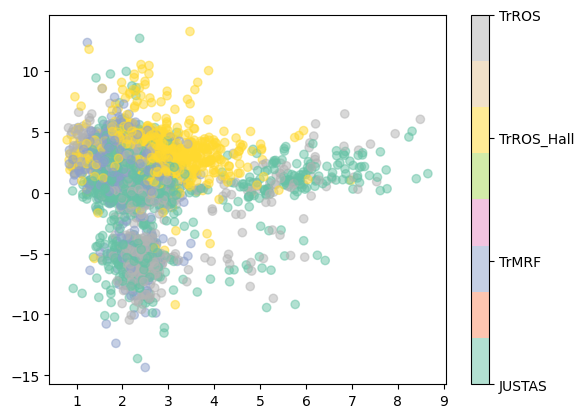

In [43]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Create a scatter plot
plt.scatter(np.mean(merged_df['log_CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist(), c=method_codes, cmap='Set2', alpha = 0.5)

# Add a colorbar with method labels
cbar = plt.colorbar()
cbar.set_ticks(np.arange(len(method_labels)))
cbar.set_ticklabels(method_labels)

# Calculate Pearson correlation coefficient
correlation_coefficient, p_value = stats.spearmanr(np.mean(merged_df['log_CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist())
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Show the plot
plt.show()


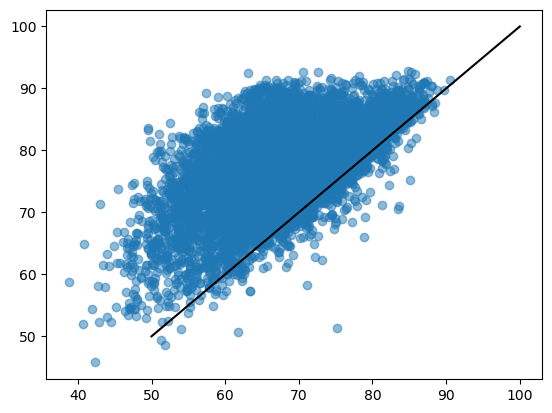

In [46]:
plt.scatter(merged_df['Full Seq PLDDT'].tolist(), merged_df['PLDDT_full'].tolist(), alpha = 0.5)
plt.plot([50,100], [50,100], color='black')

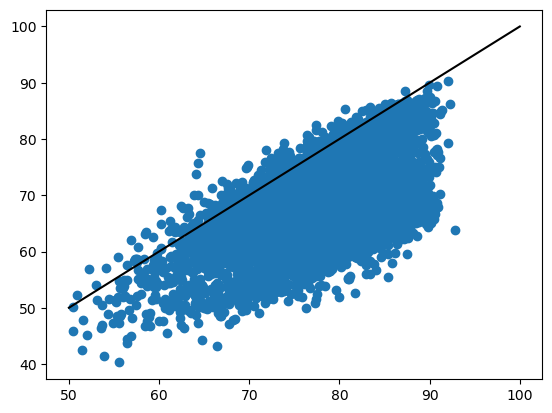

In [47]:
plt.scatter(np.mean(merged_df['PLDDT_mask'].tolist(), axis=-1), np.mean(merged_df['Half Masked ESMFold Plddt'].tolist(), axis=-1))
plt.plot([50,100], [50,100], color='black')

## 1-3. dG

In [49]:
from scipy.stats import pearsonr, spearmanr
import matplotlib.pyplot as plt

def scatter_and_correlation(ax, df, x_column, y_column, label_x, label_y, xlim=None, ylim=None):
    # Drop rows with NaN values in the specified columns
    df_no_nan = df[[x_column, y_column]].dropna()

    # Scatter plot
    ax.scatter(df_no_nan[x_column].tolist(), df_no_nan[y_column].tolist(), color='black')
    ax.set_title(f'{label_x} vs {label_y}')
    ax.set_xlabel(label_x)
    ax.set_ylabel(label_y)

    # Customize xlim and ylim if provided
    if xlim is not None:
        ax.set_xlim(xlim)
    if ylim is not None:
        ax.set_ylim(ylim)

    # Calculate Pearson correlation coefficient
    pearson_coefficient, _ = pearsonr(df_no_nan[x_column], df_no_nan[y_column])

    # Calculate Spearman rank correlation coefficient
    spearman_coefficient, _ = spearmanr(df_no_nan[x_column], df_no_nan[y_column])

    # Add Pearson and Spearman correlation coefficients to the plot
    ax.text(0.5, 0.95, f"Pearson Coeff: {pearson_coefficient:.2f}", transform=ax.transAxes,
            horizontalalignment='center', verticalalignment='top', fontsize=10)
    ax.text(0.5, 0.90, f"Spearman Coeff: {spearman_coefficient:.2f}", transform=ax.transAxes,
            horizontalalignment='center', verticalalignment='top', fontsize=10)

    return pearson_coefficient, spearman_coefficient

# Create a 1x4 subplot grid


def plot_experiment_vs_computation(ylabel ='log10_K50_t'):
    
    fig, axs = plt.subplots(2, 6, figsize=(20, 6), dpi=200)
    axs = axs.flatten()

    # Example usage for each subplot with customized xlim and ylim
    p1,s1=scatter_and_correlation(axs[0], merged_df, 'Full Seq PLDDT', ylabel, 'Full Seq PLDDT', ylabel, xlim=(20, 100), ylim=(-4, 6))
    p2,s2=scatter_and_correlation(axs[1], merged_df, 'Half Masked ESMFold Average Plddt', ylabel, 'Half Masked ESMFold Average Plddt', ylabel, xlim=(20, 100),   ylim=(-4, 6))
    p3,s3=scatter_and_correlation(axs[2], merged_df, 'Max Half Masked ESMFold Plddt', ylabel, 'Max Half Masked ESMFold Plddt', ylabel, xlim=(20, 100),   ylim=(-4, 6))
    p4,s4=scatter_and_correlation(axs[3], merged_df, 'ESM Score', ylabel, 'ESM Score', ylabel, xlim=(0, 20),  ylim=(-4, 6))
    p5,s5=scatter_and_correlation(axs[4], merged_df, 'AF_plddt', ylabel, 'AF-Plddt', ylabel, xlim=(35, 100), ylim=(-4, 6))
    p6,s6=scatter_and_correlation(axs[5], merged_df, 'inter_pae',ylabel, 'Inter-PAEe', ylabel, xlim=(15, 40),  ylim=(-4, 6))
    p7,s7=scatter_and_correlation(axs[6], merged_df, 'unconditional_CE', ylabel, 'Unconditional \n ProteinMPNN CE', ylabel, xlim=(1, 2.5), ylim=(-4, 6))
    p8,s8=scatter_and_correlation(axs[7], merged_df, 'conditional_CE', ylabel, 'Conditional \n ProteinMPNN CE', ylabel, xlim=(1, 2.5),  ylim=(-4, 6))
    p9,s9=scatter_and_correlation(axs[8], merged_df, 'Hybrid Composite Score', ylabel, 'Hybrid Composite Score', ylabel, xlim=(10, 90),  ylim=(-4, 6))
    p10,s10=scatter_and_correlation(axs[9], merged_df, 'log_CE_full', ylabel, 'log ESMFold Distogram CE', ylabel, xlim=(0, 10),  ylim=(-4, 6))
    p11,s11=scatter_and_correlation(axs[10], merged_df, 'CE_full', ylabel, 'ESMFold Distogram CE', ylabel, xlim=(0, 1),  ylim=(-4, 6))

    K_t_p = [p1, p2,p3,p4,p5,p6,p7,p8,p9, p10, p11]
    K_t_s = [s1, s2,s3,s4,s5,s6,s7,s8,s9, s10, s11]

    # Adjust layout to prevent clipping of titles
    plt.tight_layout()

    # Show the plot
    plt.show()
    
    return K_t_p, K_t_s

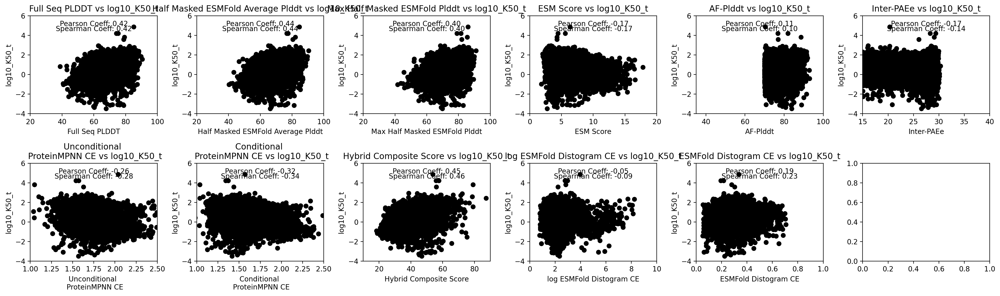

In [50]:
K_t_p, K_t_s= plot_experiment_vs_computation(ylabel ='log10_K50_t')

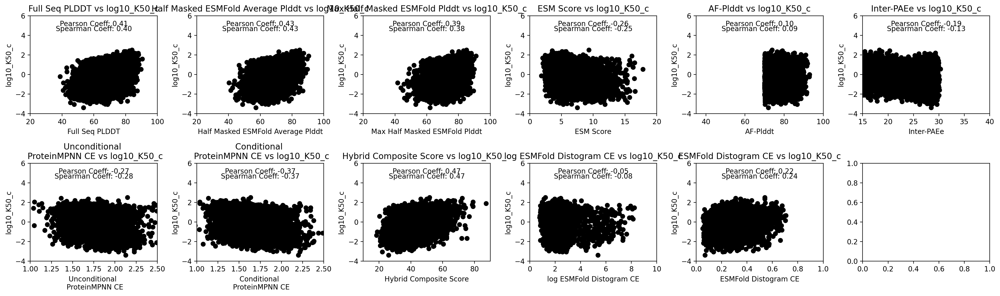

In [51]:
K_c_p, K_c_s= plot_experiment_vs_computation(ylabel ='log10_K50_c')

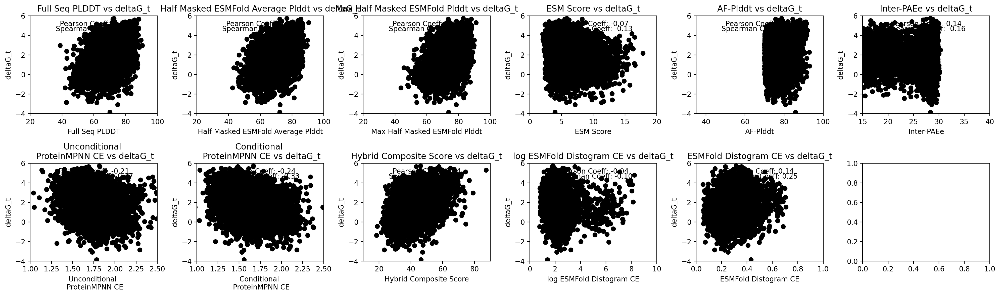

In [52]:
G_t_p, G_t_s= plot_experiment_vs_computation(ylabel ='deltaG_t')

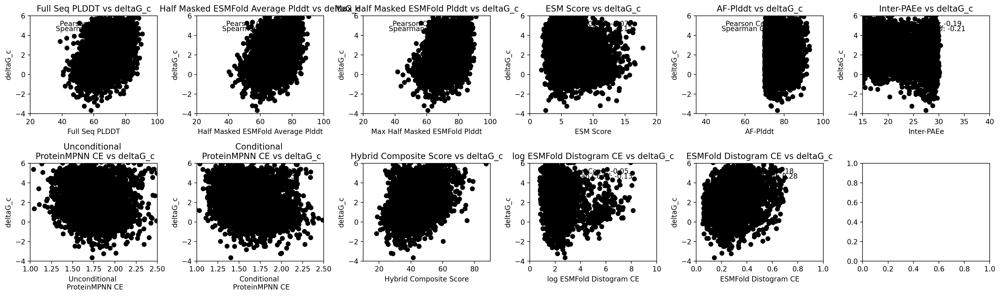

In [53]:
G_c_p, G_c_s= plot_experiment_vs_computation(ylabel ='deltaG_c')

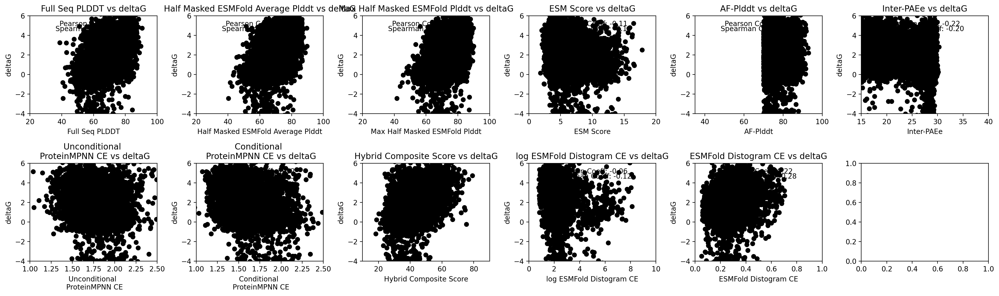

In [54]:
G_p, G_s= plot_experiment_vs_computation(ylabel ='deltaG')

In [55]:
import numpy as np
import matplotlib.pyplot as plt

num_groups = 5
bar_width = 0.08
index = np.arange(num_groups)

# Rainbow colormap
data_p = [K_t_p, K_c_p, G_t_p, G_c_p, G_p]
data_s = [K_t_s, K_c_s, G_t_s, G_c_s, G_s]

    
data_p = np.abs(np.array(data_p))
data_s = np.abs(np.array(data_s))

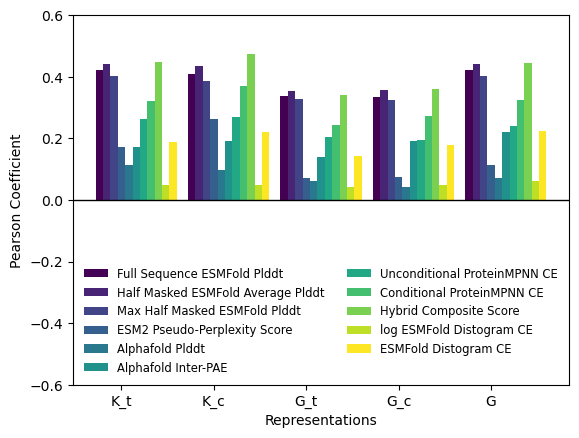

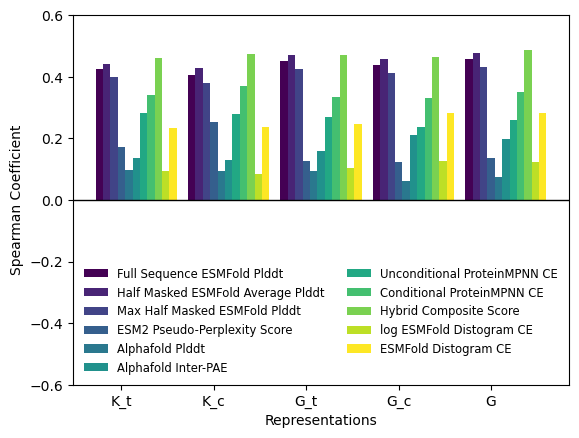

In [69]:

# colors = plt.cm.rainbow(np.linspace(1, 0, 9))
colors = plt.cm.viridis(np.linspace(0, 1, 11))
# colors[-1] = [0.5, 0.5, 0.5, 1.0]

# Create grouped bar graph with pastel colors
plt.bar(index - 3 * bar_width, data_p[:, 0], bar_width, label='Full Sequence ESMFold Plddt', color =colors[0])
plt.bar(index - 2 * bar_width, data_p[:, 1], bar_width, label='Half Masked ESMFold Average Plddt', color =colors[1])
plt.bar(index - bar_width, data_p[:, 2], bar_width, label='Max Half Masked ESMFold Plddt', color =colors[2])
plt.bar(index, data_p[:, 3], bar_width, label='ESM2 Pseudo-Perplexity Score', color =colors[3])
plt.bar(index+bar_width, data_p[:, 4], bar_width, label='Alphafold Plddt', color =colors[4])
plt.bar(index + 2*bar_width, data_p[:, 5], bar_width, label='Alphafold Inter-PAE', color =colors[5])
plt.bar(index+3*bar_width, data_p[:, 6], bar_width, label='Unconditional ProteinMPNN CE', color =colors[6])
plt.bar(index + 4*bar_width, data_p[:, 7], bar_width, label='Conditional ProteinMPNN CE', color =colors[7])
plt.bar(index + 5*bar_width, data_p[:, 8], bar_width, label='Hybrid Composite Score', color =colors[8])
plt.bar(index + 6*bar_width, data_p[:, 9], bar_width, label='log ESMFold Distogram CE', color =colors[9])
plt.bar(index + 7*bar_width, data_p[:, 10], bar_width, label='ESMFold Distogram CE', color =colors[10])

plt.axhline(y=0, color='black', linestyle='-', linewidth=1)

# Customize the plot
plt.xlabel('Representations')
plt.ylabel('Pearson Coefficient')
plt.ylim([-0.6, 0.6])
# plt.title('Grouped Bar Graph for Different Stability Factors')
plt.xticks(index, ['K_t', 'K_c', 'G_t', 'G_c', 'G'])
plt.legend(loc="lower center", fontsize="small",  frameon = False)

# plt.savefig('figures/models_pearson_coefficient_viridis.png',  dpi=300)
# Show the plot
plt.show()


# Create grouped bar graph with pastel colors
plt.bar(index - 3 * bar_width, data_s[:, 0], bar_width, label='Full Sequence ESMFold Plddt', color =colors[0])
plt.bar(index - 2 * bar_width, data_s[:, 1], bar_width, label='Half Masked ESMFold Average Plddt', color =colors[1])
plt.bar(index - bar_width, data_s[:, 2], bar_width, label='Max Half Masked ESMFold Plddt', color =colors[2])
plt.bar(index, data_s[:, 3], bar_width, label='ESM2 Pseudo-Perplexity Score', color =colors[3])
plt.bar(index+bar_width, data_s[:, 4], bar_width, label='Alphafold Plddt', color =colors[4])
plt.bar(index + 2*bar_width, data_s[:, 5], bar_width, label='Alphafold Inter-PAE', color =colors[5])
plt.bar(index+3*bar_width, data_s[:, 6], bar_width, label='Unconditional ProteinMPNN CE', color =colors[6])
plt.bar(index + 4*bar_width, data_s[:, 7], bar_width, label='Conditional ProteinMPNN CE', color =colors[7])
plt.bar(index + 5*bar_width, data_s[:, 8], bar_width, label='Hybrid Composite Score', color =colors[8])
plt.bar(index + 6*bar_width, data_s[:, 9], bar_width, label='log ESMFold Distogram CE', color =colors[9])
plt.bar(index + 7*bar_width, data_s[:, 10], bar_width, label='ESMFold Distogram CE', color =colors[10])

# Draw a black line at y=0
plt.axhline(y=0, color='black', linestyle='-', linewidth=1)

# Customize the plot
plt.xlabel('Representations')
plt.ylabel('Spearman Coefficient')
plt.ylim([-0.6, 0.6])
# plt.title('Grouped Bar Graph for Different Stability Factors')
plt.xticks(index, ['K_t', 'K_c', 'G_t', 'G_c', 'G'])
legend = plt.legend(loc="lower center", fontsize="small", frameon=False, ncol=2)

# plt.savefig('figures/models_spearman_coefficient_viridis.png', dpi=300)
# Show the plot
plt.show()

## 1.4 ddG

In [57]:
import pandas as pd
from scipy.stats import spearmanr
from itertools import combinations

def calculate_spearman_coefficient(merged_df, methods, score, exp_variable):
    # Get all combinations of 2 methods
    combinations_of_methods = list(combinations(methods, 2))

    # Create an empty DataFrame to store concatenated data
    combined_df = pd.DataFrame()

    # Concatenate all combinations into one DataFrame
    for i, (method1, method2) in enumerate(combinations_of_methods):
        # Filter DataFrame for the current combination of methods
        df_method1 = merged_df[merged_df['method'] == method1]
        df_method2 = merged_df[merged_df['method'] == method2]

        # Merge the DataFrames on 'ID' to get pairs of deltaG values for the same ID
        df_merged = pd.merge(df_method1, df_method2, on='ID', suffixes=(f'_{method1}', f'_{method2}'))

        # Rename columns to have consistent names
        df_merged.rename(columns={
            f'{exp_variable}_{method1}': exp_variable,
            f'{exp_variable}_{method2}': f'{exp_variable}_other',
            f'{score}_{method1}': score,
            f'{score}_{method2}': f'{score}_other',
            f'AF_plddt_{method1}': 'AF_plddt',
            f'AF_plddt_{method2}': 'AF_plddt_other',
        }, inplace=True)

        # Calculate the difference of PLDDT values
        df_merged['PLDDT_diff'] = df_merged['AF_plddt'] - df_merged['AF_plddt_other']

        # Concatenate into the combined DataFrame
        combined_df = pd.concat([combined_df, df_merged])
        
    
    # Calculate Spearman correlation coefficient
    spearman_coefficient, _ = spearmanr(
        combined_df[exp_variable] - combined_df[f'{exp_variable}_other'],
        combined_df[score] - combined_df[f'{score}_other'],
        nan_policy='omit'
    )
    

    return spearman_coefficient, combined_df

In [58]:
def calculate_spearman_coefficients(merged_df, methods, columns, exp_variable):
    spearman_coefficients = []
    for column in columns:
        result, output_df= calculate_spearman_coefficient(merged_df, methods, column, exp_variable)
        spearman_coefficients.append(result)
    return spearman_coefficients

methods = ['TrROS', 'TrMRF', 'TrROS_Hall', 'JUSTAS']
columns_to_calculate = [
    'Full Seq PLDDT',
    'Half Masked ESMFold Average Plddt',
    'Max Half Masked ESMFold Plddt',
    'ESM Score',
    'AF_plddt',
    'inter_pae',
    'unconditional_CE',
    'conditional_CE',
    'Hybrid Composite Score',
    'log_CE_full',
    'CE_full',
]

deltaG_t_s = calculate_spearman_coefficients(merged_df, methods, columns_to_calculate, 'deltaG_t')
deltaG_c_s = calculate_spearman_coefficients(merged_df, methods, columns_to_calculate, 'deltaG_c')
delta_G_s = calculate_spearman_coefficients(merged_df, methods, columns_to_calculate, 'deltaG')
log10_K50_t_s = calculate_spearman_coefficients(merged_df, methods, columns_to_calculate, 'log10_K50_t')
log10_K50_c_s = calculate_spearman_coefficients(merged_df, methods, columns_to_calculate, 'log10_K50_c')

In [59]:
id_counts = merged_df['ID'].value_counts().to_dict()

In [49]:
merged_df.keys()

Index(['name', 'sequence_x', 'Full Seq PLDDT', 'Half Masked ESMFold Plddt',
       'Max Half Masked ESMFold Plddt', 'Half Masked ESMFold Average Plddt',
       'ESM Score', 'AF_plddt', 'inter_pae', 'log10_K50_t', 'log10_K50_t_95CI',
       'log10_K50_c', 'log10_K50_c_95CI', 'deltaG_t', 'deltaG_t_95CI',
       'deltaG_c', 'deltaG_c_95CI', 'deltaG', 'deltaG_95CI',
       'unconditional_CE', 'conditional_CE', 'Hybrid Composite Score',
       'sequence_y', 'log_CE_x', 'CE_x', 'PLDDT_x', 'PTM_x', 'sequence',
       'log_CE_y', 'CE_y', 'PLDDT_y', 'PTM_y', 'ID', 'method'],
      dtype='object')

0.23720755772660923


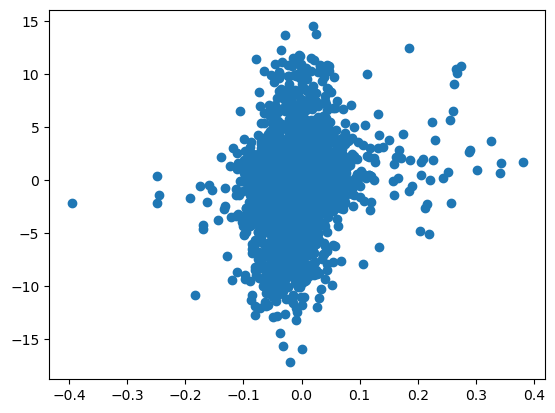

In [60]:
result, output_df= calculate_spearman_coefficient(merged_df, methods, 'CE_full',  'deltaG')
plt.scatter(output_df['CE_full'] - output_df['CE_full_other'], output_df['deltaG'] - output_df['deltaG_other'])
print(result)

0.10167583001270902


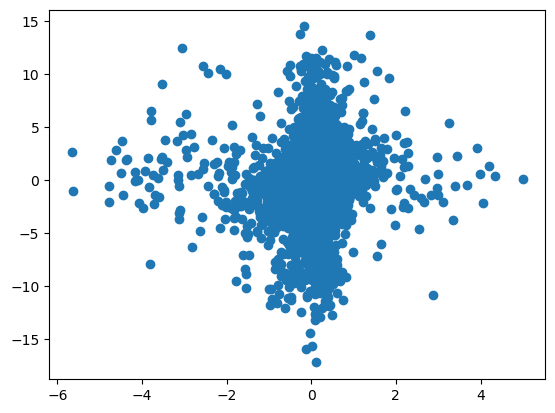

In [61]:
result, output_df= calculate_spearman_coefficient(merged_df, methods, 'log_CE_full',  'deltaG')
plt.scatter(output_df['log_CE_full'] - output_df['log_CE_full_other'], output_df['deltaG'] - output_df['deltaG_other'])
print(result)

0.4446024726656694


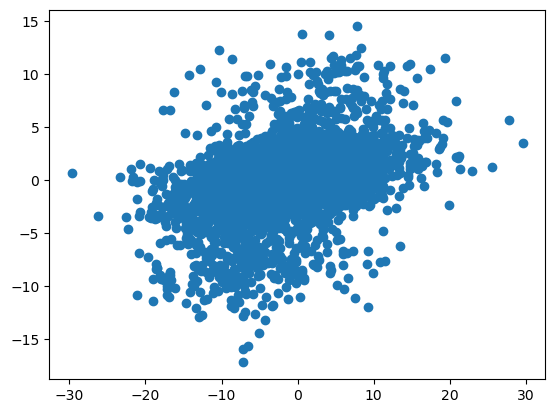

In [ ]:
result, output_df= calculate_spearman_coefficient(merged_df, methods, 'Half Masked ESMFold Average Plddt',  'deltaG')
plt.scatter(output_df['Half Masked ESMFold Average Plddt'] - output_df['Half Masked ESMFold Average Plddt_other'], output_df['deltaG'] - output_df['deltaG_other'])
print(result)

In [109]:
# merged_df['Hybrid Composite Score_2'] = merged_df['ESM Score']/merged_df['conditional_CE']

0.5069719670459362


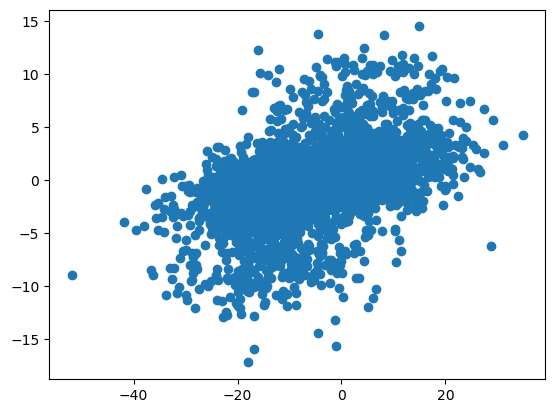

In [103]:
result, output_df= calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score',  'deltaG')
plt.scatter(output_df['Hybrid Composite Score'] - output_df['Hybrid Composite Score_other'], output_df['deltaG'] - output_df['deltaG_other'])
print(result)

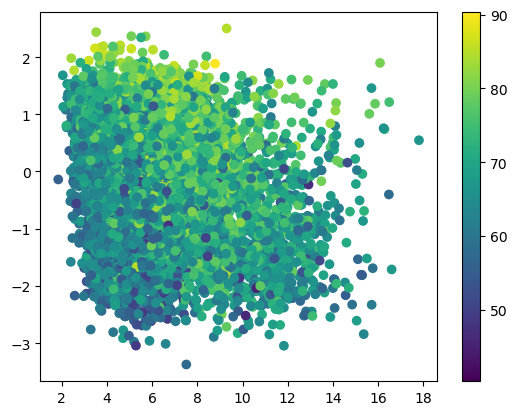

In [39]:
result, output_df= calculate_spearman_coefficient(merged_df, methods, 'ESM Score',  'log10_K50_c')
plt.scatter(merged_df['ESM Score'] , merged_df['log10_K50_c'], c= merged_df['Half Masked ESMFold Average Plddt'])
plt.colorbar()

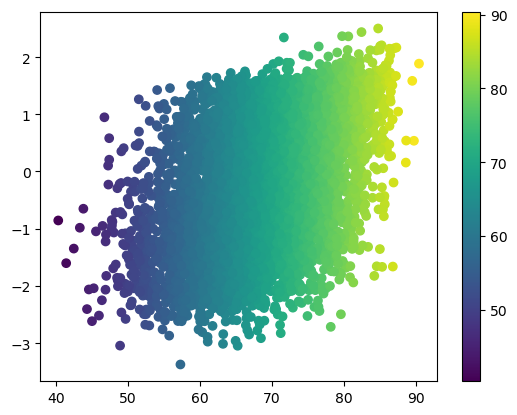

In [87]:
plt.scatter(merged_df['Half Masked ESMFold Average Plddt'] , merged_df['log10_K50_c'], c= merged_df['Half Masked ESMFold Average Plddt'])
plt.colorbar()

Spearman Correlation Coefficient: 0.4278342426389184


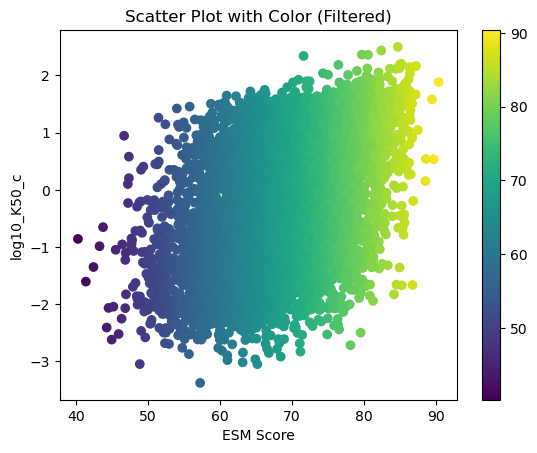

In [86]:
import matplotlib.pyplot as plt

# Filter the DataFrame based on the condition
filtered_df = merged_df[merged_df['Half Masked ESMFold Average Plddt'] > 70]


# Scatter plot with color based on 'Half Masked ESMFold Average Plddt'
plt.scatter(merged_df['Half Masked ESMFold Average Plddt'], merged_df['log10_K50_c'], c=merged_df['Half Masked ESMFold Average Plddt'])
plt.colorbar()

# Adding labels and title
plt.xlabel('ESM Score')
plt.ylabel('log10_K50_c')
plt.title('Scatter Plot with Color (Filtered)')

# Show the plot

spearman_coefficient, _ = spearmanr(merged_df['Half Masked ESMFold Average Plddt'], merged_df['log10_K50_c'])

# Print the result
print(f"Spearman Correlation Coefficient: {spearman_coefficient}")


plt.show()

In [63]:
import numpy as np
import matplotlib.pyplot as plt

num_groups = 5
bar_width = 0.08
index = np.arange(num_groups)

# Rainbow colormap
dd_s = [log10_K50_t_s, log10_K50_c_s, deltaG_t_s, deltaG_c_s, delta_G_s]
dd_s = np.abs(np.array(dd_s))

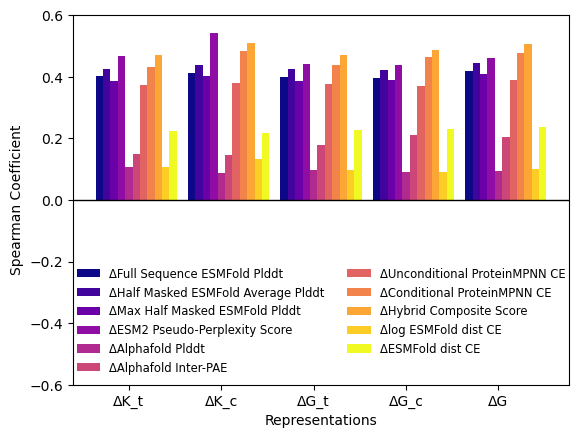

In [65]:

# colors = plt.cm.rainbow(np.linspace(1, 0, 9))
colors = plt.cm.plasma(np.linspace(0, 1, 11))
# colors[-1] = [0.5, 0.5, 0.5, 1.0]

# Create grouped bar graph with pastel colors
plt.bar(index - 4 * bar_width, dd_s[:, 0], bar_width, label='ΔFull Sequence ESMFold Plddt', color =colors[0])
plt.bar(index - 3 * bar_width, dd_s[:, 1], bar_width, label='ΔHalf Masked ESMFold Average Plddt', color =colors[1])
plt.bar(index - 2*bar_width, dd_s[:, 2], bar_width, label='ΔMax Half Masked ESMFold Plddt', color =colors[2])
plt.bar(index-bar_width, dd_s[:, 3], bar_width, label='ΔESM2 Pseudo-Perplexity Score', color =colors[3])
plt.bar(index, dd_s[:, 4], bar_width, label='ΔAlphafold Plddt', color =colors[4])
plt.bar(index + bar_width, dd_s[:, 5], bar_width, label='ΔAlphafold Inter-PAE', color =colors[5])
plt.bar(index+2*bar_width, dd_s[:, 6], bar_width, label='ΔUnconditional ProteinMPNN CE', color =colors[6])
plt.bar(index + 3*bar_width, dd_s[:, 7], bar_width, label='ΔConditional ProteinMPNN CE', color =colors[7])
plt.bar(index + 4*bar_width, dd_s[:, 8], bar_width, label='ΔHybrid Composite Score', color =colors[8])
plt.bar(index + 5*bar_width, dd_s[:, 9], bar_width, label='Δlog ESMFold dist CE', color =colors[9])
plt.bar(index + 6*bar_width, dd_s[:, 10], bar_width, label='ΔESMFold dist CE', color =colors[10])
plt.axhline(y=0, color='black', linestyle='-', linewidth=1)

# Customize the plot
plt.xlabel('Representations')
plt.ylabel('Spearman Coefficient')
plt.ylim([-0.6, 0.6])
# plt.title('Grouped Bar Graph for Different Stability Factors')
plt.xticks(index, ['ΔK_t', 'ΔK_c', 'ΔG_t', 'ΔG_c', 'ΔG'])
legend = plt.legend(loc="lower center", fontsize="small", frameon=False, ncol=2)

# plt.savefig('figures/models_delta_spearman_coefficient_plasma.png',  dpi=300)
# Show the plot

plt.show()


## 2. AF struct  * ESMFold distogram

In [196]:
df_half_maked = pd.read_csv('all_4_half_masked_seq_CE_af2_total.csv')

In [197]:
df_full = pd.read_csv('all_4_full_seq_CE_af2.csv')

In [198]:
import ast

# Convert the string representation of lists to actual lists
df_half_maked['log_CE'] = df_half_maked['log_CE'].apply(ast.literal_eval)
df_half_maked['CE'] = df_half_maked['CE'].apply(ast.literal_eval)
df_half_maked['PLDDT'] = df_half_maked['PLDDT'].apply(ast.literal_eval)
df_half_maked['PTM'] = df_half_maked['PTM'].apply(ast.literal_eval)

In [199]:
df_merged =pd.read_csv('all_4_AF_plddt70_inter_pae_015_softmax_CE.csv')
merged_df = df_merged.merge(df_half_maked[['name', 'log_CE', 'CE', 'PLDDT', 'PTM']], on='name', how='left')
merged_df = merged_df.merge(df_full[['name', 'log_CE', 'CE', 'PLDDT', 'PTM']], on='name', how='left')
merged_df['Half Masked ESMFold Plddt'] = merged_df['Half Masked ESMFold Plddt'].apply(ast.literal_eval)
merged_df[['ID', 'method']] = merged_df['name'].apply(lambda x: pd.Series(["_".join(x.split("_")[:2]), "_".join(x.split("_")[2:])]))

In [200]:
merged_df.keys()

Index(['name', 'sequence', 'Full Seq PLDDT', 'Half Masked ESMFold Plddt',
       'Max Half Masked ESMFold Plddt', 'Half Masked ESMFold Average Plddt',
       'ESM Score', 'AF_plddt', 'inter_pae', 'log10_K50_t', 'log10_K50_t_95CI',
       'log10_K50_c', 'log10_K50_c_95CI', 'deltaG_t', 'deltaG_t_95CI',
       'deltaG_c', 'deltaG_c_95CI', 'deltaG', 'deltaG_95CI',
       'unconditional_CE', 'unconditional_softmax_CE', 'conditional_CE',
       'conditional_softmax_CE', 'Hybrid Composite Score', 'log_CE_x', 'CE_x',
       'PLDDT_x', 'PTM_x', 'log_CE_y', 'CE_y', 'PLDDT_y', 'PTM_y', 'ID',
       'method'],
      dtype='object')

In [201]:
column_replacements = {
    'log_CE_x': 'log_CE_mask',
    'CE_x': 'CE_mask',
    'PLDDT_x': 'PLDDT_mask',
    'PTM_x': 'PTM_mask'
}

# Rename the columns in merged_df
merged_df = merged_df.rename(columns=column_replacements)

In [202]:
column_replacements = {
    'log_CE_y': 'log_CE_full',
    'CE_y': 'CE_full',
    'PLDDT_y': 'PLDDT_full',
    'PTM_y': 'PTM_full'
}

# Rename the columns in merged_df
merged_df = merged_df.rename(columns=column_replacements)

In [203]:
# Assuming merged_df is your DataFrame
merged_df.dropna(subset=['PLDDT_full'], inplace=True)

In [204]:
merged_df.keys()

Index(['name', 'sequence', 'Full Seq PLDDT', 'Half Masked ESMFold Plddt',
       'Max Half Masked ESMFold Plddt', 'Half Masked ESMFold Average Plddt',
       'ESM Score', 'AF_plddt', 'inter_pae', 'log10_K50_t', 'log10_K50_t_95CI',
       'log10_K50_c', 'log10_K50_c_95CI', 'deltaG_t', 'deltaG_t_95CI',
       'deltaG_c', 'deltaG_c_95CI', 'deltaG', 'deltaG_95CI',
       'unconditional_CE', 'unconditional_softmax_CE', 'conditional_CE',
       'conditional_softmax_CE', 'Hybrid Composite Score', 'log_CE_mask',
       'CE_mask', 'PLDDT_mask', 'PTM_mask', 'log_CE_full', 'CE_full',
       'PLDDT_full', 'PTM_full', 'ID', 'method'],
      dtype='object')

Text(0.5, 1.0, 'Pearson Correlation Coefficient \n 0.29640701532144903')

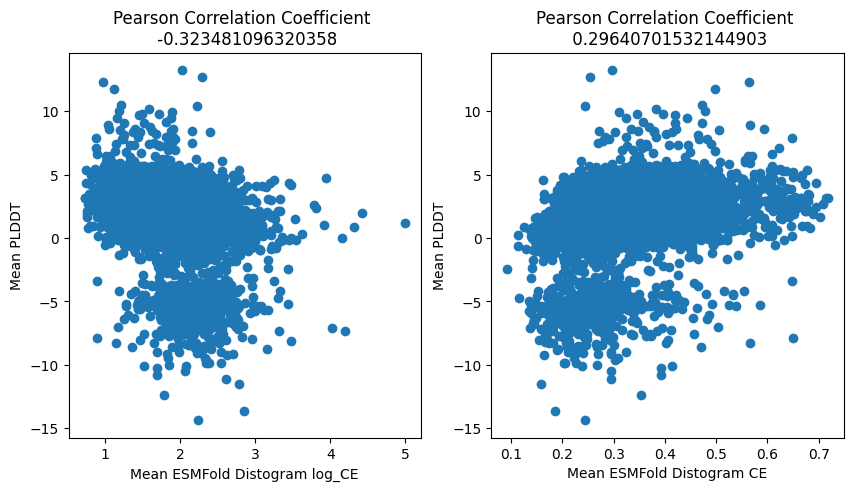

In [132]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a figure with two subplots in a single column
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# First Scatter Plot
ax1.scatter(np.mean(merged_df['log_CE_mask'].tolist(), axis=-1), merged_df['deltaG'])

# Calculate Pearson Correlation Coefficient for the first plot
correlation_coefficient, p_value = stats.pearsonr(np.mean(merged_df['log_CE_mask'].tolist(), axis=-1), merged_df['deltaG'])
ax1.set_xlabel('Mean ESMFold Distogram log_CE')
ax1.set_ylabel('Mean PLDDT')
ax1.set_title(f"Pearson Correlation Coefficient \n {correlation_coefficient}")

# Second Scatter Plot
ax2.scatter(np.mean(merged_df['CE_mask'].tolist(), axis=-1), merged_df['deltaG'])

# Calculate Pearson Correlation Coefficient for the second plot
correlation_coefficient, p_value = stats.pearsonr(np.mean(merged_df['CE_mask'].tolist(), axis=-1), merged_df['deltaG'])
ax2.set_xlabel('Mean ESMFold Distogram CE')
ax2.set_ylabel('Mean PLDDT')
ax2.set_title(f"Pearson Correlation Coefficient \n {correlation_coefficient}")

In [207]:
def calculate_average(lst):
    return sum(lst) / len(lst)

# Apply the function to each row in the 'log_CE_mask' column
merged_df['log_CE_avg_mask'] = merged_df['log_CE_mask'].apply(calculate_average)
merged_df['CE_avg_mask'] = merged_df['CE_mask'].apply(calculate_average)

Text(0.5, 1.0, 'Pearson Correlation Coefficient \n -0.8874923794390924')

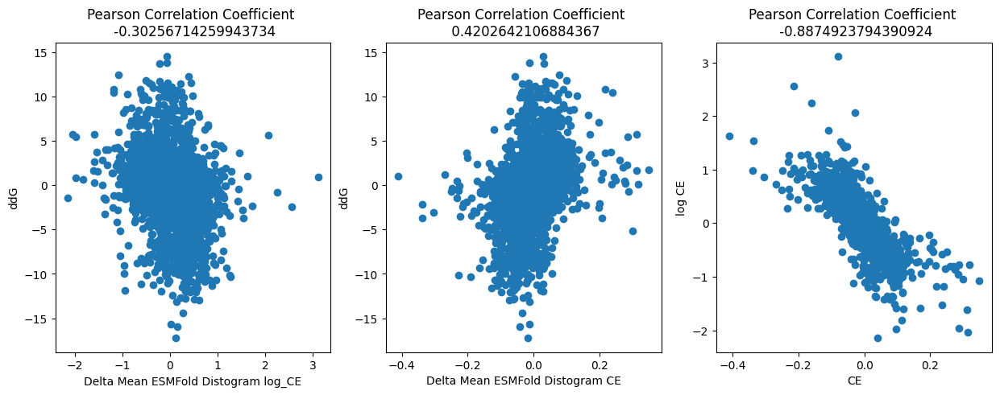

In [208]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

result, output_df= calculate_spearman_coefficient(merged_df, methods, 'log_CE_avg_mask',  'deltaG')
ax1.scatter(output_df['log_CE_avg_mask'] - output_df['log_CE_avg_mask_other'], output_df['deltaG'] - output_df['deltaG_other'])
ax1.set_xlabel('Delta Mean ESMFold Distogram log_CE')
ax1.set_ylabel('ddG')
ax1.set_title(f"Pearson Correlation Coefficient \n {result}")

result, output_df= calculate_spearman_coefficient(merged_df, methods, 'CE_avg_mask',  'deltaG')
ax2.scatter(output_df['CE_avg_mask'] - output_df['CE_avg_mask_other'], output_df['deltaG'] - output_df['deltaG_other'])
ax2.set_xlabel('Delta Mean ESMFold Distogram CE')
ax2.set_ylabel('ddG')
ax2.set_title(f"Pearson Correlation Coefficient \n {result}")


result, output_df= calculate_spearman_coefficient(merged_df, methods, 'CE_avg_mask',  'log_CE_avg_mask')
ax3.scatter(output_df['CE_avg_mask'] - output_df['CE_avg_mask_other'], output_df['log_CE_avg_mask'] - output_df['log_CE_avg_mask_other'])
ax3.set_xlabel('CE')
ax3.set_ylabel('log CE')
ax3.set_title(f"Pearson Correlation Coefficient \n {result}")

In [209]:
def get_correlation(df, x_column, y_column):
    # Drop rows with NaN values in the specified columns
    df_no_nan = df[[x_column, y_column]].dropna()

    # plt.scatter(df_no_nan[x_column].tolist(), df_no_nan[y_column].tolist(), color='black')


    # Calculate Pearson correlation coefficient
    pearson_coefficient, _ = pearsonr(df_no_nan[x_column], df_no_nan[y_column])

    # Calculate Spearman rank correlation coefficient
    spearman_coefficient, _ = spearmanr(df_no_nan[x_column], df_no_nan[y_column])

    return pearson_coefficient, spearman_coefficient

def Hybrid_score_ratio_scanning_CE(ylabel, ratio):
    merged_df['Hybrid Composite Score 1'] = -ratio*merged_df['conditional_CE'] + (1-ratio)*merged_df['Half Masked ESMFold Average Plddt'] 
    merged_df['Hybrid Composite Score 2'] = -ratio*merged_df['conditional_CE'] + (1-ratio)*merged_df['CE_avg_mask']
    merged_df['Hybrid Composite Score 3'] = -ratio*merged_df['conditional_CE'] + (1-ratio)*merged_df['CE_full']
    p1,s1=get_correlation(merged_df, 'Hybrid Composite Score 1', ylabel)  
    p2,s2=get_correlation(merged_df, 'Hybrid Composite Score 2', ylabel)
    p3,s3=get_correlation(merged_df, 'Hybrid Composite Score 3', ylabel)
    
    return [p1, s1, p2,s2,p3,s3], merged_df

def Hybrid_score_ratio_scanning_log_CE(ylabel, ratio):
    merged_df['Hybrid Composite Score 1'] = -ratio*merged_df['conditional_CE'] + (1-ratio)*merged_df['Half Masked ESMFold Average Plddt'] 
    merged_df['Hybrid Composite Score 2'] = ratio*merged_df['conditional_CE'] + (1-ratio)*merged_df['log_CE_avg_mask']
    merged_df['Hybrid Composite Score 3'] = ratio*merged_df['conditional_CE'] + (1-ratio)*merged_df['log_CE_full']
    p1,s1=get_correlation(merged_df, 'Hybrid Composite Score 1', ylabel)  
    p2,s2=get_correlation(merged_df, 'Hybrid Composite Score 2', ylabel)
    p3,s3=get_correlation(merged_df, 'Hybrid Composite Score 3', ylabel)
    
    return [p1, s1, p2,s2,p3,s3], merged_df

For the first scatter plot (black):
Maximum correlation: 0.507365745600972
Corresponding ratio: 0.9437500000000001

For the second scatter plot (red):
Maximum correlation: 0.46639307960763715
Corresponding ratio: 0.25

For the third scatter plot (blue):
Maximum correlation: 0.45794166689234456
Corresponding ratio: 0.25


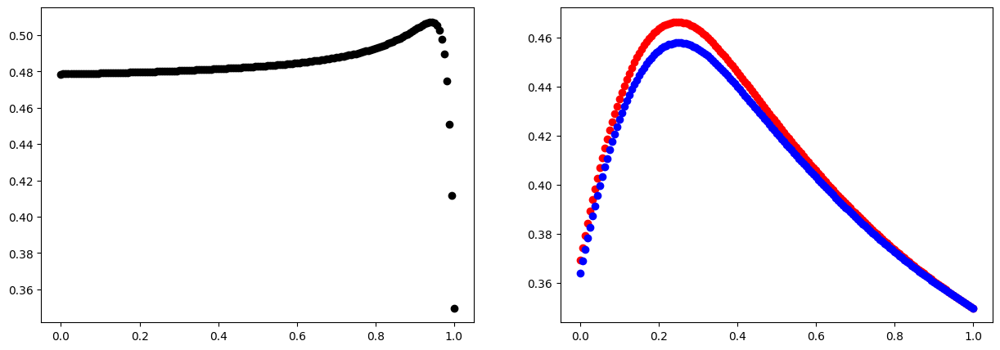

In [210]:
from scipy.stats import pearsonr, spearmanr

ratio  =np.linspace(0,1,161)
correlation_ls=[]
for numb in ratio:
    correlation_ls.append(Hybrid_score_ratio_scanning_CE('deltaG', numb)[0])

    
correlation_ls = np.array(correlation_ls)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.scatter(ratio, correlation_ls[:,1], color='black')

ax2.scatter(ratio, abs(correlation_ls[:,3]), color='red')
ax2.scatter(ratio, abs(correlation_ls[:,5]), color='blue')

max_ratio1_index = np.argmax(correlation_ls[:, 1])
max_ratio2_index = np.argmax(np.abs(correlation_ls[:, 3]))
max_ratio3_index = np.argmax(np.abs(correlation_ls[:, 5]))

# Get the corresponding ratio values
max_ratio1 = ratio[max_ratio1_index]
max_ratio2 = ratio[max_ratio2_index]
max_ratio3 = ratio[max_ratio3_index]

print("For the first scatter plot (black):")
print("Maximum correlation:", correlation_ls[max_ratio1_index, 1])
print("Corresponding ratio:", max_ratio1)

print("\nFor the second scatter plot (red):")
print("Maximum correlation:", np.abs(correlation_ls[max_ratio2_index, 3]))
print("Corresponding ratio:", max_ratio2)

print("\nFor the third scatter plot (blue):")
print("Maximum correlation:", np.abs(correlation_ls[max_ratio3_index, 5]))
print("Corresponding ratio:", max_ratio3)

In [211]:
merged_df['Hybrid Composite Score 1'] = -0.944*merged_df['conditional_CE'] + 0.056*merged_df['Half Masked ESMFold Average Plddt']
merged_df['Hybrid Composite Score 2'] = -0.25*merged_df['conditional_CE'] + 0.75*merged_df['CE_avg_mask']
merged_df['Hybrid Composite Score 3'] = -0.25*merged_df['conditional_CE'] + 0.75*merged_df['CE_full']

Text(0.5, 1.0, 'Pearson Correlation Coefficient \n 0.5129187256239485')

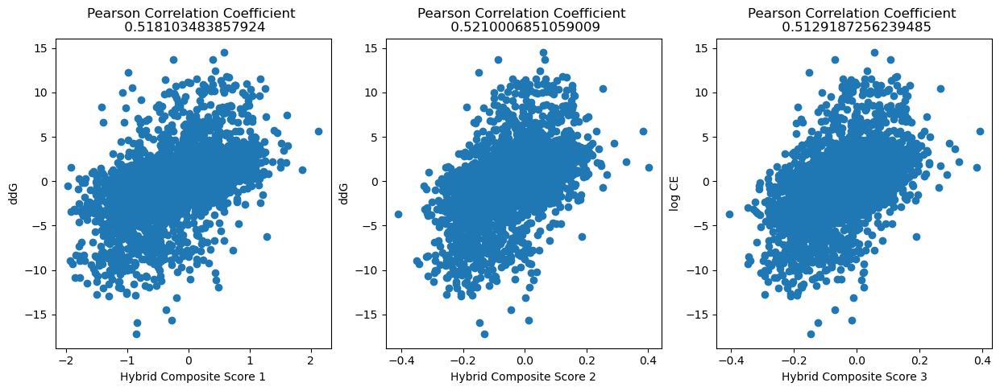

In [73]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

result, output_df= calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score 1',  'deltaG')
ax1.scatter(output_df['Hybrid Composite Score 1'] - output_df['Hybrid Composite Score 1_other'], output_df['deltaG'] - output_df['deltaG_other'])
ax1.set_xlabel('Hybrid Composite Score 1')
ax1.set_ylabel('ddG')
ax1.set_title(f"Pearson Correlation Coefficient \n {result}")

result, output_df= calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score 2',  'deltaG')
ax2.scatter(output_df['Hybrid Composite Score 2'] - output_df['Hybrid Composite Score 2_other'], output_df['deltaG'] - output_df['deltaG_other'])
ax2.set_xlabel('Hybrid Composite Score 2')
ax2.set_ylabel('ddG')
ax2.set_title(f"Pearson Correlation Coefficient \n {result}")


result, output_df= calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score 3',  'deltaG')
ax3.scatter(output_df['Hybrid Composite Score 3'] - output_df['Hybrid Composite Score 3_other'], output_df['deltaG'] - output_df['deltaG_other'])
ax3.set_xlabel('Hybrid Composite Score 3')
ax3.set_ylabel('log CE')
ax3.set_title(f"Pearson Correlation Coefficient \n {result}")

In [212]:
merged_df['Hybrid Composite Score 3']

0      -0.242699
1      -0.208327
2      -0.259131
3      -0.246076
4      -0.148389
          ...   
5434   -0.122528
5435   -0.363176
5436   -0.187719
5437   -0.213525
5438   -0.165265
Name: Hybrid Composite Score 3, Length: 5438, dtype: float64

For the first scatter plot (black):
Maximum correlation: 0.507365745600972
Corresponding ratio: 0.9437500000000001

For the second scatter plot (red):
Maximum correlation: 0.45768774168347465
Corresponding ratio: 0.59375

For the third scatter plot (blue):
Maximum correlation: 0.43693284252668724
Corresponding ratio: 0.625


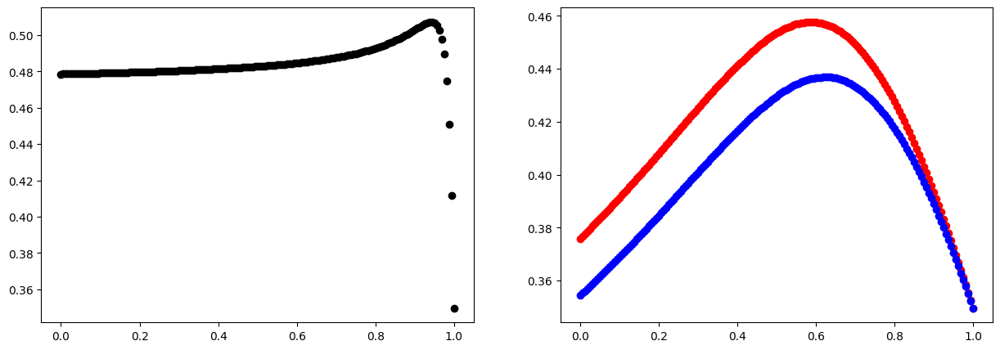

In [213]:
from scipy.stats import pearsonr, spearmanr

ratio  =np.linspace(0,1,161)
correlation_ls=[]
for numb in ratio:
    correlation_ls.append(Hybrid_score_ratio_scanning_log_CE('deltaG', numb)[0])

    
correlation_ls = np.array(correlation_ls)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.scatter(ratio, correlation_ls[:,1], color='black')

ax2.scatter(ratio, abs(correlation_ls[:,3]), color='red')
ax2.scatter(ratio, abs(correlation_ls[:,5]), color='blue')

max_ratio1_index = np.argmax(correlation_ls[:, 1])
max_ratio2_index = np.argmax(np.abs(correlation_ls[:, 3]))
max_ratio3_index = np.argmax(np.abs(correlation_ls[:, 5]))

# Get the corresponding ratio values
max_ratio1 = ratio[max_ratio1_index]
max_ratio2 = ratio[max_ratio2_index]
max_ratio3 = ratio[max_ratio3_index]

print("For the first scatter plot (black):")
print("Maximum correlation:", correlation_ls[max_ratio1_index, 1])
print("Corresponding ratio:", max_ratio1)

print("\nFor the second scatter plot (red):")
print("Maximum correlation:", np.abs(correlation_ls[max_ratio2_index, 3]))
print("Corresponding ratio:", max_ratio2)

print("\nFor the third scatter plot (blue):")
print("Maximum correlation:", np.abs(correlation_ls[max_ratio3_index, 5]))
print("Corresponding ratio:", max_ratio3)

In [214]:
merged_df['Hybrid Composite Score 1'] = -0.944*merged_df['conditional_CE'] + 0.056*merged_df['Half Masked ESMFold Average Plddt']
merged_df['Hybrid Composite Score 2'] = 0.59375*merged_df['conditional_CE'] + (1-0.59375)*merged_df['log_CE_avg_mask']
merged_df['Hybrid Composite Score 3'] = 0.625*merged_df['conditional_CE'] + (1-0.625)*merged_df['log_CE_full']

Text(0.5, 1.0, 'Pearson Correlation Coefficient \n -0.4557049338845099')

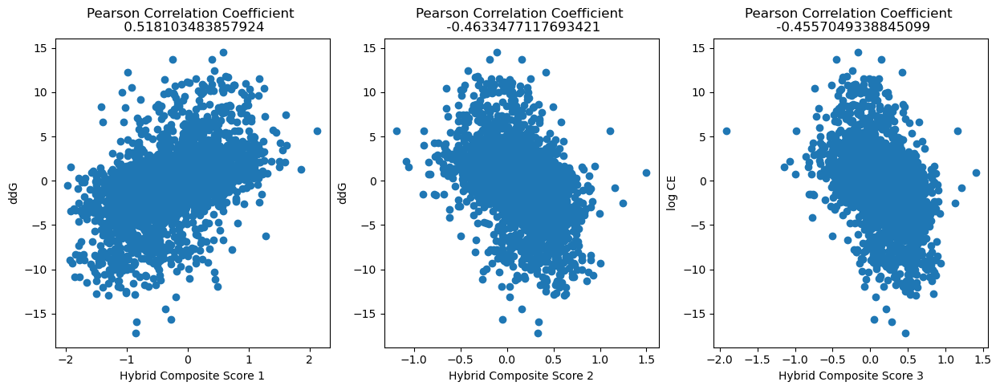

In [78]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

result, output_df= calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score 1',  'deltaG')
ax1.scatter(output_df['Hybrid Composite Score 1'] - output_df['Hybrid Composite Score 1_other'], output_df['deltaG'] - output_df['deltaG_other'])
ax1.set_xlabel('Hybrid Composite Score 1')
ax1.set_ylabel('ddG')
ax1.set_title(f"Pearson Correlation Coefficient \n {result}")

result, output_df= calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score 2',  'deltaG')
ax2.scatter(output_df['Hybrid Composite Score 2'] - output_df['Hybrid Composite Score 2_other'], output_df['deltaG'] - output_df['deltaG_other'])
ax2.set_xlabel('Hybrid Composite Score 2')
ax2.set_ylabel('ddG')
ax2.set_title(f"Pearson Correlation Coefficient \n {result}")


result, output_df= calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score 3',  'deltaG')
ax3.scatter(output_df['Hybrid Composite Score 3'] - output_df['Hybrid Composite Score 3_other'], output_df['deltaG'] - output_df['deltaG_other'])
ax3.set_xlabel('Hybrid Composite Score 3')
ax3.set_ylabel('log CE')
ax3.set_title(f"Pearson Correlation Coefficient \n {result}")

In [32]:
# # Assuming merged_df is your DataFrame
# merged_df['Hybrid Composite Score 2'] = merged_df['conditional_CE'] + merged_df['log_CE_full']
# merged_df['Hybrid Composite Score 3'] = merged_df['conditional_CE'] + merged_df['log_CE_avg_mask']

Mean CE for JUSTAS: 0.3133502759609829
Mean CE for TrROS: 0.2947558339207804
Mean CE for TrROS_Hall: 0.3379380487388194
Mean CE for TrMRF: 0.31570583152268006


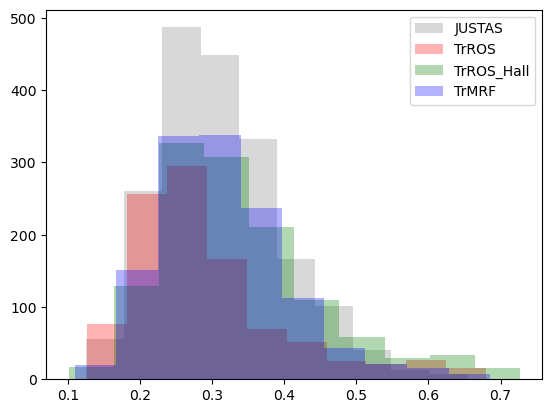

In [35]:
ce_justas = merged_df[merged_df['method'] == 'JUSTAS']['CE_full'].tolist()
ce_trros = merged_df[merged_df['method'] == 'TrROS']['CE_full'].tolist()
ce_trros_hall = merged_df[merged_df['method'] == 'TrROS_Hall']['CE_full'].tolist()
ce_trmrf = merged_df[merged_df['method'] == 'TrMRF']['CE_full'].tolist()

# Calculate mean values
mean_ce_justas = np.mean(ce_justas)
mean_ce_trros = np.mean(ce_trros)
mean_ce_trros_hall = np.mean(ce_trros_hall)
mean_ce_trmrf = np.mean(ce_trmrf)

# Print mean values
print(f"Mean CE for JUSTAS: {mean_ce_justas}")
print(f"Mean CE for TrROS: {mean_ce_trros}")
print(f"Mean CE for TrROS_Hall: {mean_ce_trros_hall}")
print(f"Mean CE for TrMRF: {mean_ce_trmrf}")

# Create histograms
plt.hist(ce_justas, color='gray', alpha=0.3, label='JUSTAS')
plt.hist(ce_trros, color='red', alpha=0.3, label='TrROS')
plt.hist(ce_trros_hall, color='green', alpha=0.3, label='TrROS_Hall')
plt.hist(ce_trmrf, color='blue', alpha=0.3, label='TrMRF')

# Add legend
plt.legend()

# Show the plot
plt.show()

Mean CE for JUSTAS: 1.9692229079180978
Mean CE for TrROS: 2.0538519341405044
Mean CE for TrROS_Hall: 1.8745334244257728
Mean CE for TrMRF: 1.9164838228291008


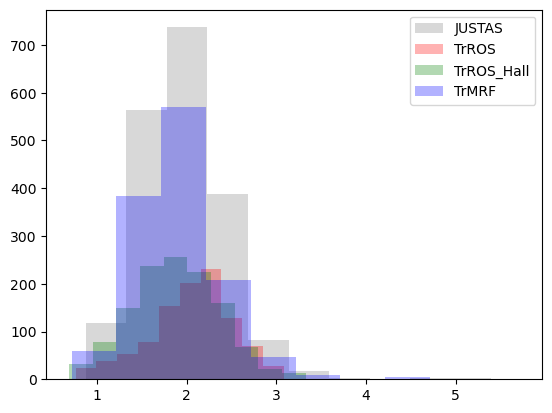

In [36]:
ce_justas = merged_df[merged_df['method'] == 'JUSTAS']['log_CE_full'].tolist()
ce_trros = merged_df[merged_df['method'] == 'TrROS']['log_CE_full'].tolist()
ce_trros_hall = merged_df[merged_df['method'] == 'TrROS_Hall']['log_CE_full'].tolist()
ce_trmrf = merged_df[merged_df['method'] == 'TrMRF']['log_CE_full'].tolist()

# Calculate mean values
mean_ce_justas = np.mean(ce_justas)
mean_ce_trros = np.mean(ce_trros)
mean_ce_trros_hall = np.mean(ce_trros_hall)
mean_ce_trmrf = np.mean(ce_trmrf)

# Print mean values
print(f"Mean CE for JUSTAS: {mean_ce_justas}")
print(f"Mean CE for TrROS: {mean_ce_trros}")
print(f"Mean CE for TrROS_Hall: {mean_ce_trros_hall}")
print(f"Mean CE for TrMRF: {mean_ce_trmrf}")

# Create histograms
plt.hist(ce_justas, color='gray', alpha=0.3, label='JUSTAS')
plt.hist(ce_trros, color='red', alpha=0.3, label='TrROS')
plt.hist(ce_trros_hall, color='green', alpha=0.3, label='TrROS_Hall')
plt.hist(ce_trmrf, color='blue', alpha=0.3, label='TrMRF')

# Add legend
plt.legend()

# Show the plot
plt.show()

## ESMFold Distogram CE

Spearman Correlation Coefficient for Method JUSTAS: 0.20224210194112155
Spearman Correlation Coefficient for Method TrMRF: 0.42162202732786147
Spearman Correlation Coefficient for Method TrROS_Hall: 0.27385028803495454
Spearman Correlation Coefficient for Method TrROS: 0.5520090728601467


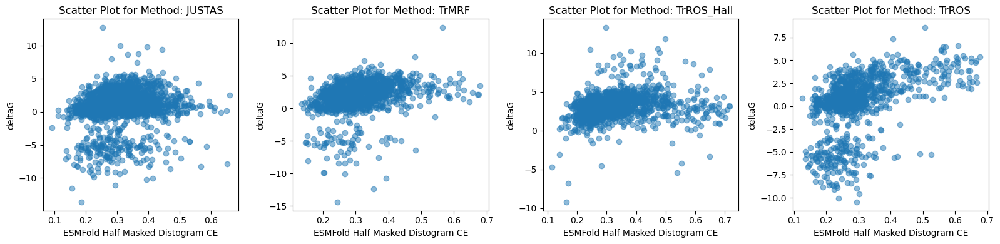

In [37]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = np.mean(subset_df['CE_mask'].tolist(), axis=-1)
    y = subset_df['deltaG'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('ESMFold Half Masked Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: -0.24850436615510502
Spearman Correlation Coefficient for Method TrMRF: -0.4011875993228401
Spearman Correlation Coefficient for Method TrROS_Hall: -0.27739195770431274
Spearman Correlation Coefficient for Method TrROS: -0.5301875702662749


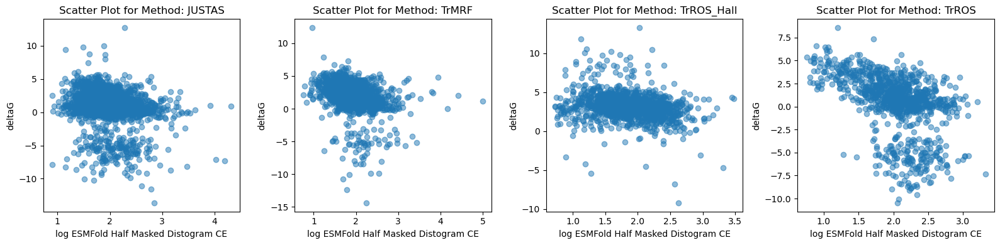

In [38]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = np.mean(subset_df['log_CE_mask'].tolist(), axis=-1)
    y = subset_df['deltaG'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('log ESMFold Half Masked Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: 0.17253982410702717
Spearman Correlation Coefficient for Method TrMRF: 0.43761107724979853
Spearman Correlation Coefficient for Method TrROS_Hall: 0.2809271761761619
Spearman Correlation Coefficient for Method TrROS: 0.5583365251241528


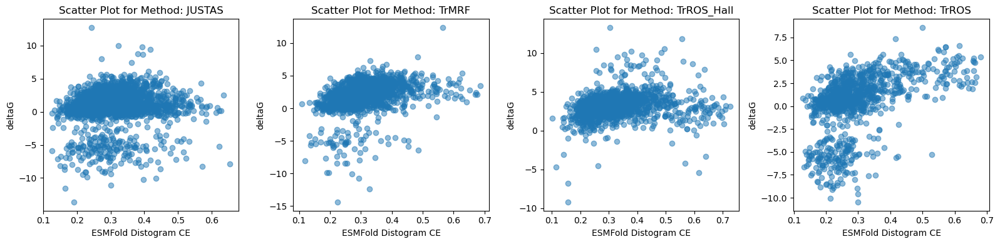

In [39]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = subset_df['CE_full'].tolist()
    y = subset_df['deltaG'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('ESMFold Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: -0.19394329134839036
Spearman Correlation Coefficient for Method TrMRF: -0.4079314283203793
Spearman Correlation Coefficient for Method TrROS_Hall: -0.2848606317906328
Spearman Correlation Coefficient for Method TrROS: -0.5314831800611716


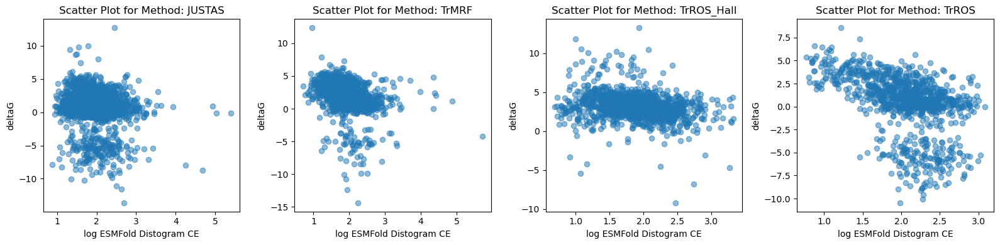

In [40]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x =subset_df['log_CE_full'].tolist()
    y = subset_df['deltaG'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('log ESMFold Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


## plddt

Spearman Correlation Coefficient for Method JUSTAS: 0.5009834809806384
Spearman Correlation Coefficient for Method TrMRF: 0.5598715355427509
Spearman Correlation Coefficient for Method TrROS_Hall: 0.5834925247614269
Spearman Correlation Coefficient for Method TrROS: 0.5958317285184311


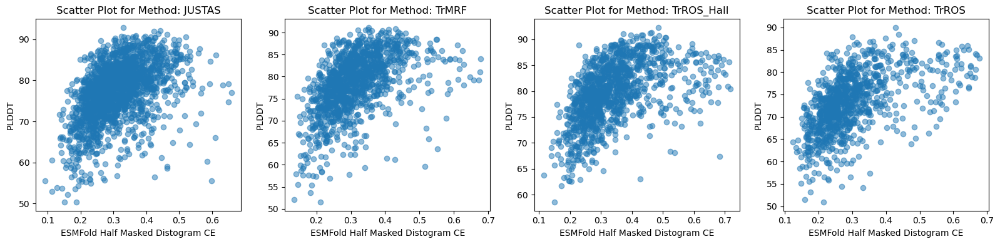

In [41]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = np.mean(subset_df['CE_mask'].tolist(), axis=-1)
    y = np.mean(subset_df['PLDDT_mask'].tolist(), axis=-1)
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('ESMFold Half Masked Distogram CE')
    ax.set_ylabel('PLDDT')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: -0.6507579861705356
Spearman Correlation Coefficient for Method TrMRF: -0.6771677273694325
Spearman Correlation Coefficient for Method TrROS_Hall: -0.6511805911726346
Spearman Correlation Coefficient for Method TrROS: -0.7077560053099284


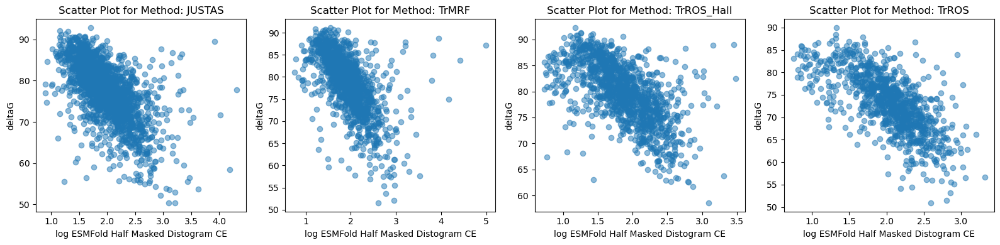

In [42]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = np.mean(subset_df['log_CE_mask'].tolist(), axis=-1)
    y = np.mean(subset_df['PLDDT_mask'].tolist(), axis=-1)
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('log ESMFold Half Masked Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: 0.5470422453880788
Spearman Correlation Coefficient for Method TrMRF: 0.5892589125086941
Spearman Correlation Coefficient for Method TrROS_Hall: 0.6057741616385615
Spearman Correlation Coefficient for Method TrROS: 0.6370759016221369


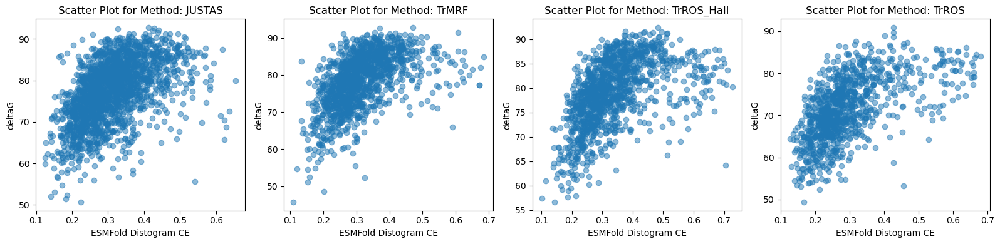

In [43]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x = subset_df['CE_full'].tolist()
    y = subset_df['PLDDT_full'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('ESMFold Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Spearman Correlation Coefficient for Method JUSTAS: -0.6168674340816507
Spearman Correlation Coefficient for Method TrMRF: -0.6427250386975729
Spearman Correlation Coefficient for Method TrROS_Hall: -0.6295110942659681
Spearman Correlation Coefficient for Method TrROS: -0.7269721003746876


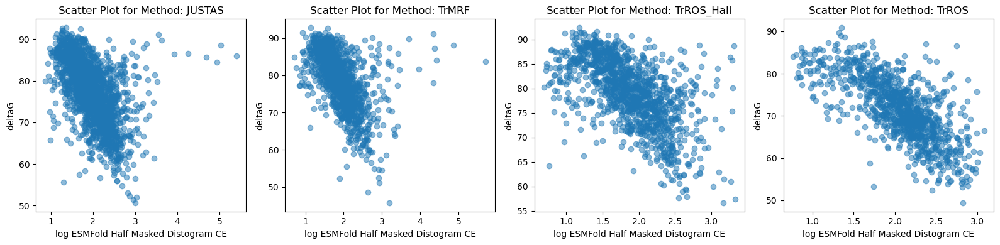

In [44]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Get unique methods
unique_methods = merged_df['method'].unique()

# Create a figure with four subplots in a single row
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Iterate through unique methods and create scatter plots
for i, method in enumerate(unique_methods):
    ax = axes[i]
    subset_df = merged_df[merged_df['method'] == method]
    
    x =subset_df['log_CE_full'].tolist()
    y = subset_df['PLDDT_full'].tolist()
    
    # Create a scatter plot for each method
    ax.scatter(x, y, alpha=0.5, label=method)
    ax.set_xlabel('log ESMFold Half Masked Distogram CE')
    ax.set_ylabel('deltaG')
    ax.set_title(f'Scatter Plot for Method: {method}')
    
    # Calculate Spearman rank correlation coefficient for each method
    correlation_coefficient, p_value = stats.spearmanr(x, y)
    print(f"Spearman Correlation Coefficient for Method {method}: {correlation_coefficient}")

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


Pearson Correlation Coefficient: 0.3691492810057112


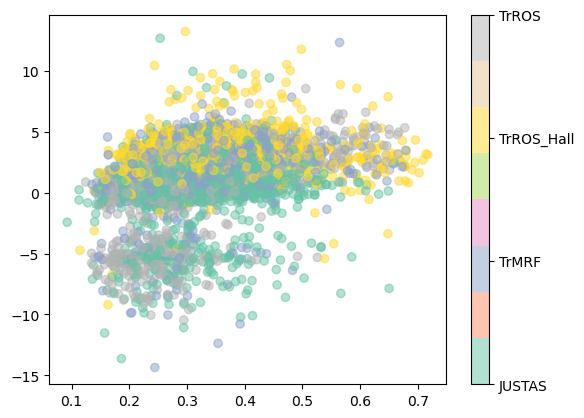

In [45]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Create a scatter plot
plt.scatter(np.mean(merged_df['CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist(), c=method_codes, cmap='Set2', alpha = 0.5)

# Add a colorbar with method labels
cbar = plt.colorbar()
cbar.set_ticks(np.arange(len(method_labels)))
cbar.set_ticklabels(method_labels)

# Calculate Pearson correlation coefficient
correlation_coefficient, p_value = stats.spearmanr(np.mean(merged_df['CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist())
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Show the plot
plt.show()


Pearson Correlation Coefficient: 0.3638151997991492


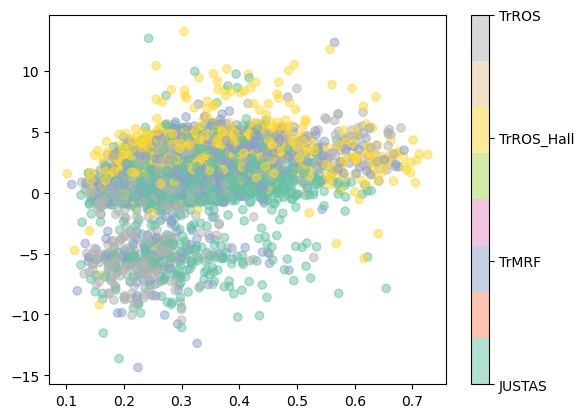

In [46]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Create a scatter plot
plt.scatter(merged_df['CE_full'], merged_df['deltaG'].tolist(), c=method_codes, cmap='Set2', alpha = 0.5)

# Add a colorbar with method labels
cbar = plt.colorbar()
cbar.set_ticks(np.arange(len(method_labels)))
cbar.set_ticklabels(method_labels)

# Calculate Pearson correlation coefficient
correlation_coefficient, p_value = stats.spearmanr(merged_df['CE_full'], merged_df['deltaG'].tolist())
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Show the plot
plt.show()


Pearson Correlation Coefficient: -0.3758565012587181


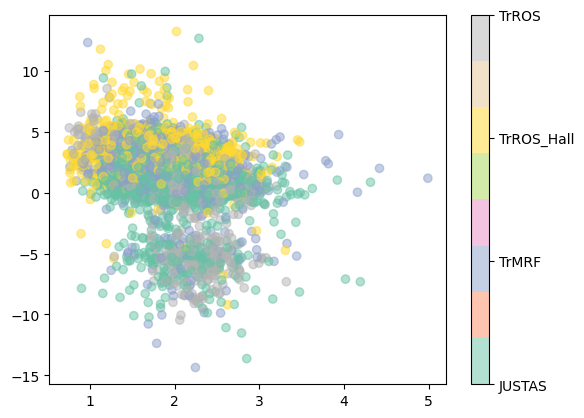

In [47]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Create a scatter plot
plt.scatter(np.mean(merged_df['log_CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist(), c=method_codes, cmap='Set2', alpha = 0.5)

# Add a colorbar with method labels
cbar = plt.colorbar()
cbar.set_ticks(np.arange(len(method_labels)))
cbar.set_ticklabels(method_labels)

# Calculate Pearson correlation coefficient
correlation_coefficient, p_value = stats.spearmanr(np.mean(merged_df['log_CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist())
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Show the plot
plt.show()


Pearson Correlation Coefficient: -0.354432716144731


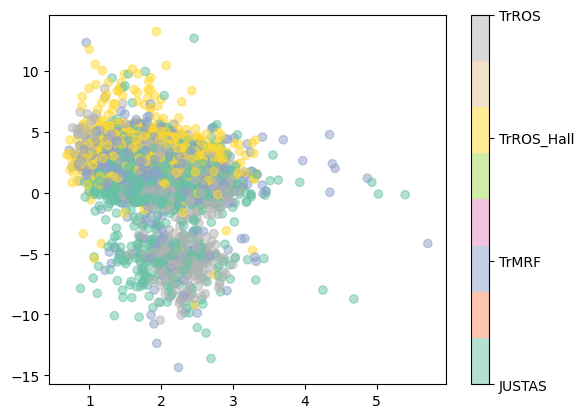

In [48]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Create a scatter plot
plt.scatter(merged_df['log_CE_full'], merged_df['deltaG'].tolist(), c=method_codes, cmap='Set2', alpha = 0.5)

# Add a colorbar with method labels
cbar = plt.colorbar()
cbar.set_ticks(np.arange(len(method_labels)))
cbar.set_ticklabels(method_labels)

# Calculate Pearson correlation coefficient
correlation_coefficient, p_value = stats.spearmanr(merged_df['log_CE_full'], merged_df['deltaG'].tolist())
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Show the plot
plt.show()


Pearson Correlation Coefficient: -0.3758565012587181


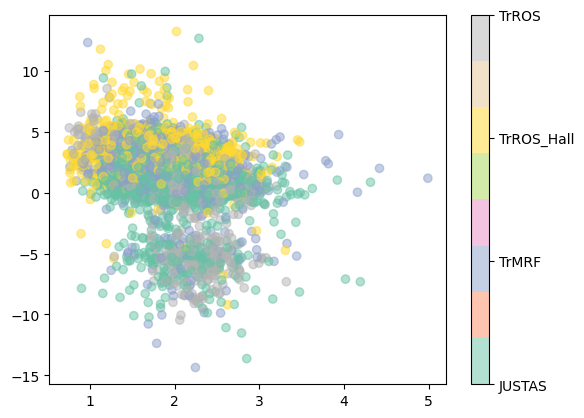

In [49]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a unique numerical code for each unique 'method' value
method_codes, method_labels = pd.factorize(merged_df['method'])

# Create a scatter plot
plt.scatter(np.mean(merged_df['log_CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist(), c=method_codes, cmap='Set2', alpha = 0.5)

# Add a colorbar with method labels
cbar = plt.colorbar()
cbar.set_ticks(np.arange(len(method_labels)))
cbar.set_ticklabels(method_labels)

# Calculate Pearson correlation coefficient
correlation_coefficient, p_value = stats.spearmanr(np.mean(merged_df['log_CE_mask'].tolist(), axis=-1), merged_df['deltaG'].tolist())
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")

# Show the plot
plt.show()


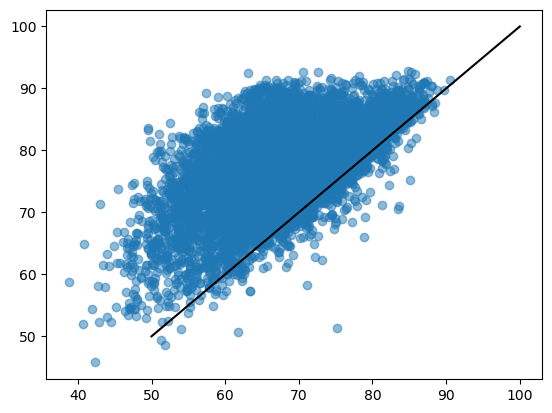

In [50]:
plt.scatter(merged_df['Full Seq PLDDT'].tolist(), merged_df['PLDDT_full'].tolist(), alpha = 0.5)
plt.plot([50,100], [50,100], color='black')

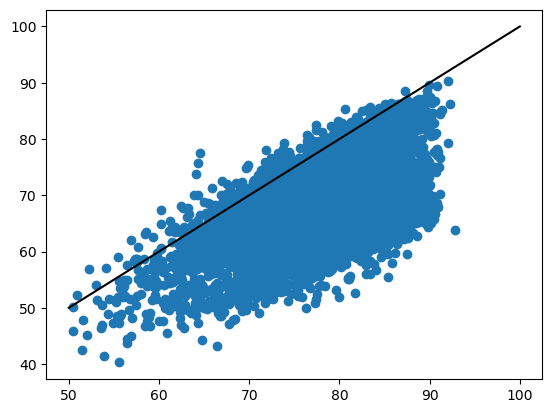

In [51]:
plt.scatter(np.mean(merged_df['PLDDT_mask'].tolist(), axis=-1), np.mean(merged_df['Half Masked ESMFold Plddt'].tolist(), axis=-1))
plt.plot([50,100], [50,100], color='black')

## dG

In [480]:
merged_df['log ESM Score'] = -np.log(merged_df['ESM Score'])

In [481]:
from scipy.stats import pearsonr, spearmanr

def get_correlation(df, x_column, y_column):
    # Drop rows with NaN values in the specified columns
    df_no_nan = df[[x_column, y_column]].dropna()

    # plt.scatter(df_no_nan[x_column].tolist(), df_no_nan[y_column].tolist(), color='black')


    # Calculate Pearson correlation coefficient
    pearson_coefficient, _ = pearsonr(df_no_nan[x_column], df_no_nan[y_column])

    # Calculate Spearman rank correlation coefficient
    spearman_coefficient, _ = spearmanr(df_no_nan[x_column], df_no_nan[y_column])

    return pearson_coefficient, spearman_coefficient

def Hybrid_score_ratio_scanning(ylabel, ratio):
    merged_df['Hybrid Composite Score 1'] = -ratio*merged_df['conditional_CE'] + (1-ratio)*merged_df['Half Masked ESMFold Average Plddt'] 
    merged_df['Hybrid Composite Score 2'] = -ratio*merged_df['conditional_CE'] + (1-ratio)*merged_df['CE_avg_mask']
    merged_df['Hybrid Composite Score 3'] = ratio*merged_df['log ESM Score'] + (1-ratio)*merged_df['Half Masked ESMFold Average Plddt']

    
    p1,s1=get_correlation(merged_df, 'Hybrid Composite Score 1', ylabel)  
    p2,s2=get_correlation(merged_df, 'Hybrid Composite Score 2', ylabel)
    p3,s3=get_correlation(merged_df, 'Hybrid Composite Score 3', ylabel)
    
    return [p1, s1, p2,s2,p3,s3]

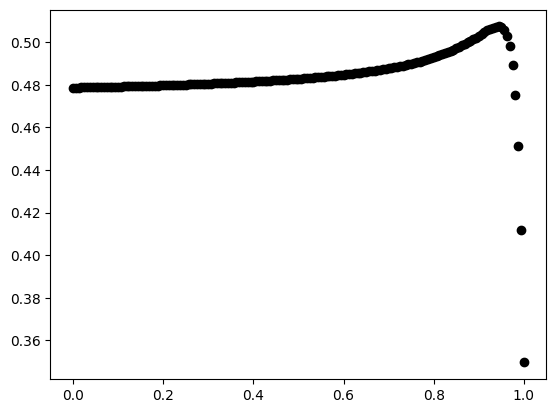

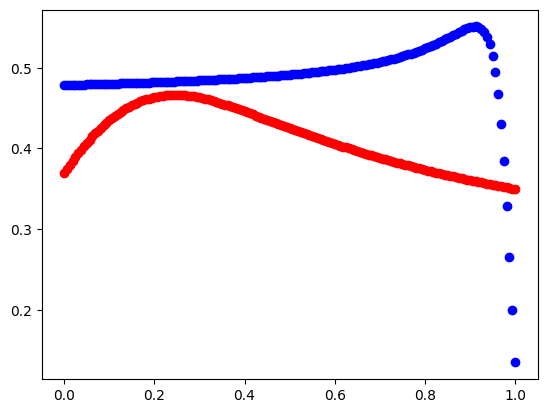

For the first scatter plot (black):
Maximum correlation: 0.507365745600972
Corresponding ratio: 0.9437500000000001

For the second scatter plot (red):
Maximum correlation: 0.46639307960763715
Corresponding ratio: 0.25

For the third scatter plot (blue):
Maximum correlation: 0.5512164844405728
Corresponding ratio: 0.9125000000000001


In [482]:

ratio  =np.linspace(0,1,161)
correlation_ls=[]
for numb in ratio:
    correlation_ls.append(Hybrid_score_ratio_scanning('deltaG', numb))
    
correlation_ls = np.array(correlation_ls)

plt.scatter(ratio, correlation_ls[:,1], color='black')
plt.show()
plt.scatter(ratio, abs(correlation_ls[:,3]), color='red')
plt.scatter(ratio, abs(correlation_ls[:,5]), color='blue')
plt.show()

max_ratio1_index = np.argmax(correlation_ls[:, 1])
max_ratio2_index = np.argmax(np.abs(correlation_ls[:, 3]))
max_ratio3_index = np.argmax(np.abs(correlation_ls[:, 5]))

# Get the corresponding ratio values
max_ratio1 = ratio[max_ratio1_index]
max_ratio2 = ratio[max_ratio2_index]
max_ratio3 = ratio[max_ratio3_index]

print("For the first scatter plot (black):")
print("Maximum correlation:", correlation_ls[max_ratio1_index, 1])
print("Corresponding ratio:", max_ratio1)

print("\nFor the second scatter plot (red):")
print("Maximum correlation:", np.abs(correlation_ls[max_ratio2_index, 3]))
print("Corresponding ratio:", max_ratio2)

print("\nFor the third scatter plot (blue):")
print("Maximum correlation:", np.abs(correlation_ls[max_ratio3_index, 5]))
print("Corresponding ratio:", max_ratio3)



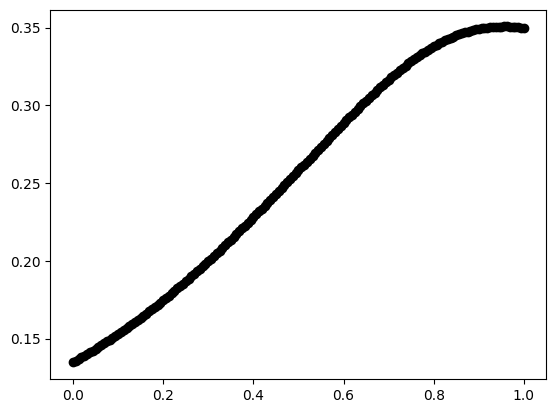

For the first scatter plot (black):
Maximum correlation: 0.35069113200332225
Corresponding ratio: 0.9625


In [483]:

ratio  =np.linspace(0,1,161)
correlation_ls=[]
for numb in ratio:
    correlation_ls.append(triple_hybrid_score_ratio_scanning('deltaG', numb))
    
correlation_ls = np.array(correlation_ls)

plt.scatter(ratio, correlation_ls[:,1], color='black')
plt.show()

max_ratio1_index = np.argmax(correlation_ls[:, 1])

# Get the corresponding ratio values
max_ratio1 = ratio[max_ratio1_index]


print("For the first scatter plot (black):")
print("Maximum correlation:", correlation_ls[max_ratio1_index, 1])
print("Corresponding ratio:", max_ratio1)


In [484]:
1-0.9125

0.08750000000000002

In [485]:
merged_df['Hybrid Composite Score 1'] = -0.944*merged_df['conditional_CE'] + 0.056*merged_df['Half Masked ESMFold Average Plddt']
merged_df['Hybrid Composite Score 2'] = -0.25*merged_df['conditional_CE'] + 0.75*merged_df['CE_avg_mask']
merged_df['Hybrid Composite Score 3'] = 0.9125*merged_df['log ESM Score'] + 0.0875*merged_df['Half Masked ESMFold Average Plddt']

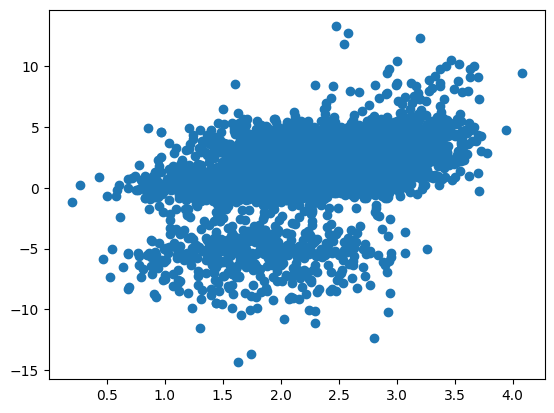

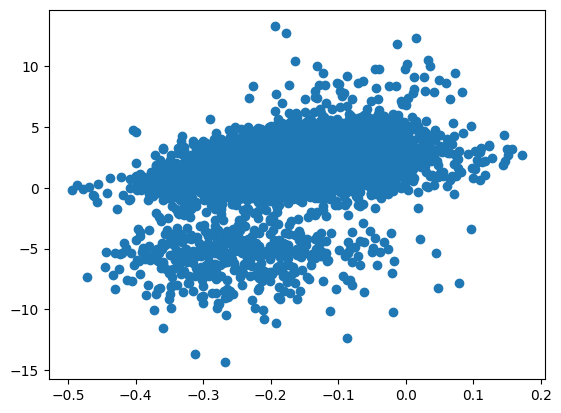

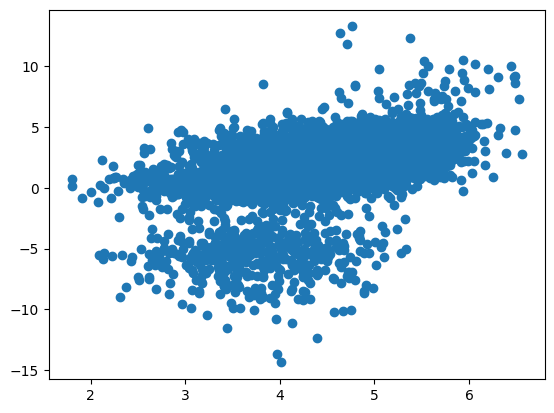

In [486]:
plt.scatter(merged_df['Hybrid Composite Score 1'], merged_df['deltaG'])
plt.show()
plt.scatter(merged_df['Hybrid Composite Score 2'], merged_df['deltaG'])
plt.show()
plt.scatter(merged_df['Hybrid Composite Score 3'], merged_df['deltaG'])
plt.show()

In [413]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

a = [np.log(item) for item in merged_df['ESM Score'].tolist()]
a1 = merged_df['ESM Score'].tolist()
b = merged_df['deltaG'].tolist()

correlation_coefficient, _ = spearmanr(a, b)
print(correlation_coefficient)

-0.13460146640905765


In [487]:
from scipy.stats import pearsonr, spearmanr
import matplotlib.pyplot as plt

def scatter_and_correlation(ax, df, x_column, y_column, label_x, label_y, xlim=None, ylim=None):
    # Drop rows with NaN values in the specified columns
    df_no_nan = df[[x_column, y_column]].dropna()

    # Scatter plot
    ax.scatter(df_no_nan[x_column].tolist(), df_no_nan[y_column].tolist(), color='black')
    ax.set_title(f'{label_x} vs {label_y}')
    ax.set_xlabel(label_x)
    ax.set_ylabel(label_y)

    # Customize xlim and ylim if provided
    if xlim is not None:
        ax.set_xlim(xlim)
    if ylim is not None:
        ax.set_ylim(ylim)

    # Calculate Pearson correlation coefficient
    pearson_coefficient, _ = pearsonr(df_no_nan[x_column], df_no_nan[y_column])

    # Calculate Spearman rank correlation coefficient
    spearman_coefficient, _ = spearmanr(df_no_nan[x_column], df_no_nan[y_column])

    # Add Pearson and Spearman correlation coefficients to the plot
    ax.text(0.5, 0.95, f"Pearson Coeff: {pearson_coefficient:.2f}", transform=ax.transAxes,
            horizontalalignment='center', verticalalignment='top', fontsize=10)
    ax.text(0.5, 0.90, f"Spearman Coeff: {spearman_coefficient:.2f}", transform=ax.transAxes,
            horizontalalignment='center', verticalalignment='top', fontsize=10)

    return pearson_coefficient, spearman_coefficient

# Create a 1x4 subplot grid


def plot_experiment_vs_computation(ylabel ='log10_K50_t'):
    
    fig, axs = plt.subplots(2, 8, figsize=(20, 6), dpi=200)
    axs = axs.flatten()

    # Example usage for each subplot with customized xlim and ylim
    p1,s1=scatter_and_correlation(axs[0], merged_df, 'Full Seq PLDDT', ylabel, 'Full Seq PLDDT', ylabel, xlim=(20, 100), ylim=(-4, 6))
    p2,s2=scatter_and_correlation(axs[1], merged_df, 'Half Masked ESMFold Average Plddt', ylabel, 'Half Masked ESMFold Average Plddt', ylabel, xlim=(20, 100),   ylim=(-4, 6))
    p3,s3=scatter_and_correlation(axs[2], merged_df, 'Max Half Masked ESMFold Plddt', ylabel, 'Max Half Masked ESMFold Plddt', ylabel, xlim=(20, 100),   ylim=(-4, 6))
    p4,s4=scatter_and_correlation(axs[3], merged_df, 'log ESM Score', ylabel, 'log ESM Score', ylabel, xlim=(0, 20),  ylim=(-4, 6))
    p5,s5=scatter_and_correlation(axs[4], merged_df, 'AF_plddt', ylabel, 'AF-Plddt', ylabel, xlim=(35, 100), ylim=(-4, 6))
    p6,s6=scatter_and_correlation(axs[5], merged_df, 'inter_pae',ylabel, 'Inter-PAEe', ylabel, xlim=(15, 40),  ylim=(-4, 6))
    p7,s7=scatter_and_correlation(axs[6], merged_df, 'unconditional_CE', ylabel, 'Unconditional \n ProteinMPNN CE', ylabel, xlim=(1, 2.5), ylim=(-4, 6))
    p8,s8=scatter_and_correlation(axs[7], merged_df, 'conditional_CE', ylabel, 'Conditional \n ProteinMPNN CE', ylabel, xlim=(1, 2.5),  ylim=(-4, 6))
    p9,s9=scatter_and_correlation(axs[8], merged_df, 'Hybrid Composite Score 1', ylabel, 'Hybrid Composite Score', ylabel, xlim=(-5, 0),  ylim=(-4, 6))
    p10,s10=scatter_and_correlation(axs[9], merged_df, 'log_CE_full', ylabel, 'log ESMFold Distogram CE', ylabel, xlim=(0, 10),  ylim=(-4, 6))
    p11,s11=scatter_and_correlation(axs[10], merged_df, 'CE_full', ylabel, 'ESMFold Distogram CE', ylabel, xlim=(0, 1),  ylim=(-4, 6))
    p12,s12=scatter_and_correlation(axs[11], merged_df, 'Hybrid Composite Score 2', ylabel, 'Hybrid Composite Score 2', ylabel,  xlim=(-0.25, 0.5),  ylim=(-4, 6))
    p13,s13=scatter_and_correlation(axs[12], merged_df, 'log_CE_avg_mask', ylabel, 'log Half Masked ESMFold Distogram CE', ylabel, xlim=(0, 10),  ylim=(-4, 6))
    p14,s14=scatter_and_correlation(axs[13], merged_df, 'CE_avg_mask', ylabel, 'Half Masked ESMFold Distogram CE', ylabel, xlim=(0, 1),  ylim=(-4, 6))
    p15,s15=scatter_and_correlation(axs[14], merged_df, 'Hybrid Composite Score 3', ylabel, 'Hybrid Composite Score 3', ylabel,  xlim=(-0.25, 0.5),  ylim=(-4, 6))


    K_t_p = [p1, p2,p3,p4,p5,p6,p7,p8,p9, p10, p11, p12, p13,p14,p15]
    K_t_s = [s1, s2,s3,s4,s5,s6,s7,s8,s9, s10, s11, s12,s13,s14,s15]

    # Adjust layout to prevent clipping of titles
    plt.tight_layout()

    # Show the plot
    plt.show()
    
    return K_t_p, K_t_s

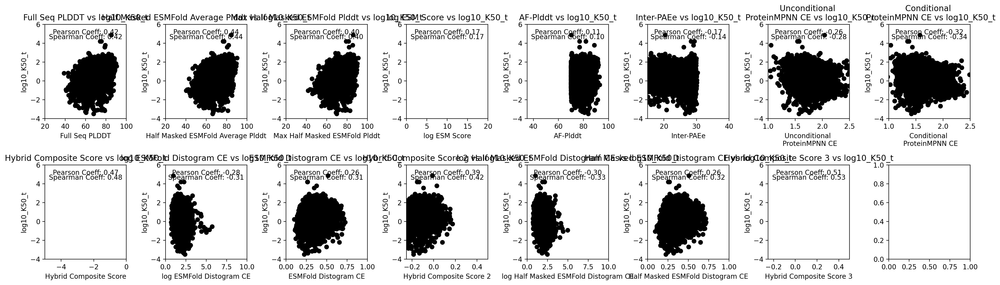

In [488]:
K_t_p, K_t_s= plot_experiment_vs_computation(ylabel ='log10_K50_t')

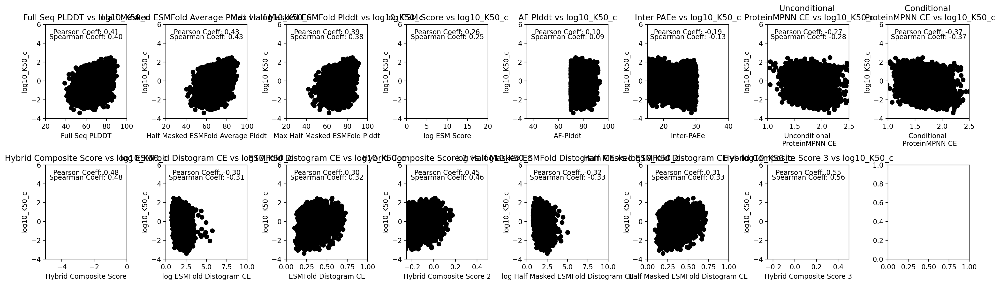

In [489]:
K_c_p, K_c_s= plot_experiment_vs_computation(ylabel ='log10_K50_c')

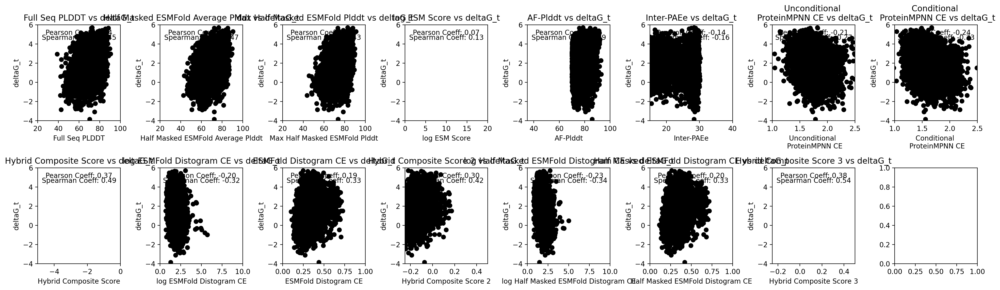

In [490]:
G_t_p, G_t_s= plot_experiment_vs_computation(ylabel ='deltaG_t')

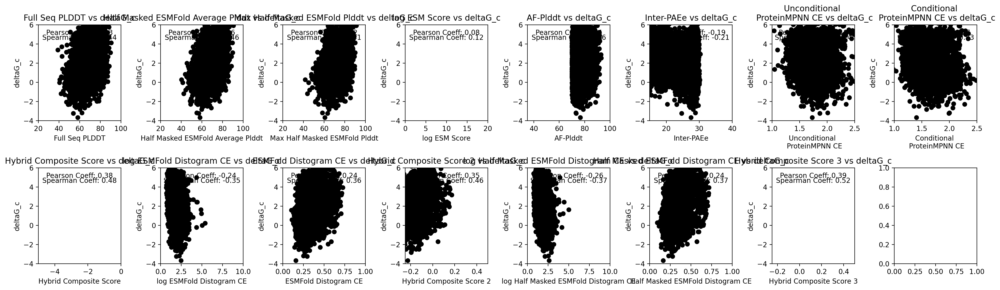

In [491]:
G_c_p, G_c_s= plot_experiment_vs_computation(ylabel ='deltaG_c')

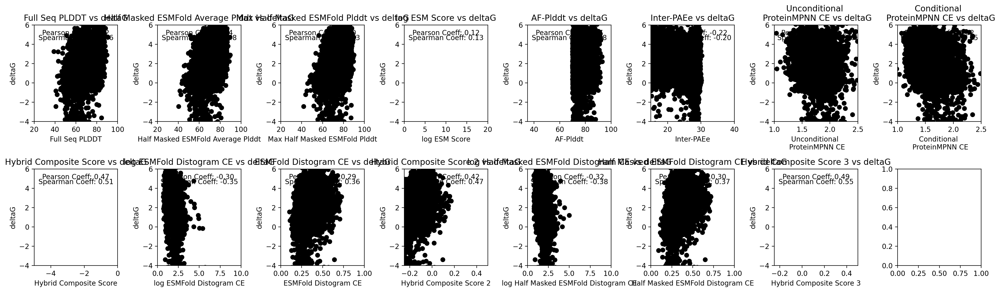

In [492]:
G_p, G_s= plot_experiment_vs_computation(ylabel ='deltaG')

In [493]:
import numpy as np
import matplotlib.pyplot as plt

num_groups = 5
bar_width = 0.08
index = np.arange(num_groups)

# Rainbow colormap
data_p = [K_t_p, K_c_p, G_t_p, G_c_p, G_p]
data_s = [K_t_s, K_c_s, G_t_s, G_c_s, G_s]

    
data_p = np.abs(np.array(data_p))
data_s = np.abs(np.array(data_s))

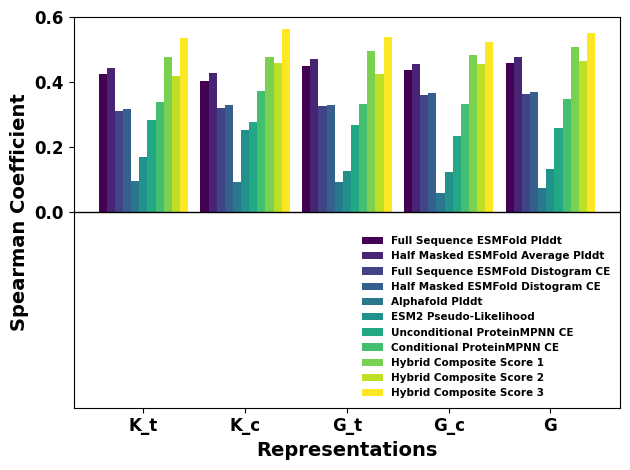

In [513]:
# colors = plt.cm.rainbow(np.linspace(1, 0, 9))
colors = plt.cm.viridis(np.linspace(0, 1, 11))
# colors[-1] = [0.5, 0.5, 0.5, 1.0]

# # Create grouped bar graph with pastel colors
# plt.bar(index - 5 * bar_width, data_p[:, 0], bar_width, label='Full Sequence ESMFold Plddt', color =colors[0])
# plt.bar(index - 4* bar_width, data_p[:, 1], bar_width, label='Half Masked ESMFold Average Plddt', color =colors[1])
# # plt.bar(index - bar_width, data_p[:, 2], bar_width, label='Max Half Masked ESMFold Plddt', color =colors[2])
# plt.bar(index -3*bar_width, data_p[:, 10], bar_width, label='Full Sequence ESMFold Distogram CE', color =colors[2])
# plt.bar(index - 2*bar_width, data_p[:, 13], bar_width, label='Half Masked ESMFold Distogram CE', color =colors[3])
# plt.bar(index- 1*bar_width, data_p[:, 4], bar_width, label='Alphafold Plddt', color =colors[4])
# plt.bar(index , data_p[:, 3], bar_width, label='ESM2 Pseudo-Likelihood', color =colors[5])
# plt.bar(index + 1*bar_width, data_p[:, 5], bar_width, label='Alphafold Inter-PAE', color =colors[6])
# plt.bar(index + 2*bar_width, data_p[:, 6], bar_width, label='Unconditional ProteinMPNN CE', color =colors[7])
# plt.bar(index + 3*bar_width, data_p[:, 7], bar_width, label='Conditional ProteinMPNN CE', color =colors[8])

# # plt.bar(index + 7*bar_width, data_p[:, 10], bar_width, label='ESMFold Distogram CE', color =colors[9])
# # plt.bar(index + 8*bar_width, data_p[:, 11], bar_width, label='Hybrid Composite Score 2', color =colors[9])
# # plt.bar(index + 10*bar_width, data_p[:, 13], bar_width, label='ESMFold Half MaskedDistogram CE', color =colors[11])
# plt.bar(index + 4*bar_width, data_p[:, 8], bar_width, label='Hybrid Composite Score 1', color =colors[9])
# plt.bar(index + 5*bar_width, data_p[:, 11], bar_width, label='Hybrid Composite Score 2', color =colors[10])
# plt.bar(index + 6*bar_width, data_p[:, 14], bar_width, label='Hybrid Composite Score 3', color =colors[11])

# plt.axhline(y=0, color='black', linestyle='-', linewidth=1)



# # Customize the plot
# plt.xlabel('Representations', fontsize = 14, weight= 'bold')
# plt.ylabel('Pearson Coefficient', fontsize = 14, weight= 'bold')
# plt.ylim([-0.6, 0.6])
# # plt.title('Grouped Bar Graph for Different Stability Factors')
# plt.xticks(index, ['K_t', 'K_c', 'G_t', 'G_c', 'G'], fontsize = 12 , weight = 'bold')
# plt.yticks(fontsize = 12 , weight = 'bold')
# plt.yticks(np.arange(0, 0.65, 0.2), fontsize=12, weight='bold')  # Adjust the step as needed

# legend = plt.legend(loc='lower right', fontsize= 7, frameon=False)
# for text in legend.get_texts():
#     text.set_weight('bold')  # Make legend text bold

# # plt.savefig('/home/jupyter-yehlin/DMSV2/figures/final_bold_figures/models_pearson_coefficient_viridis.png',  dpi=300)
# # Show the plot
# plt.show()


# Create grouped bar graph with pastel colors
plt.bar(index - 5 * bar_width, data_s[:, 0], bar_width, label='Full Sequence ESMFold Plddt', color =colors[0])
plt.bar(index - 4* bar_width, data_s[:, 1], bar_width, label='Half Masked ESMFold Average Plddt', color =colors[1])
# plt.bar(index - bar_width, data_s[:, 2], bar_width, label='Max Half Masked ESMFold Plddt', color =colors[2])
plt.bar(index -3*bar_width, data_s[:, 10], bar_width, label='Full Sequence ESMFold Distogram CE', color =colors[2])
plt.bar(index - 2*bar_width, data_s[:, 13], bar_width, label='Half Masked ESMFold Distogram CE', color =colors[3])
plt.bar(index- 1*bar_width, data_s[:, 4], bar_width, label='Alphafold Plddt', color =colors[4])
plt.bar(index, data_s[:, 3], bar_width, label='ESM2 Pseudo-Likelihood', color =colors[5])
# plt.bar(index + 1*bar_width, data_s[:, 5], bar_width, label='Alphafold Inter-PAE', color =colors[6])
plt.bar(index + 1*bar_width, data_s[:, 6], bar_width, label='Unconditional ProteinMPNN CE', color =colors[6])
plt.bar(index + 2*bar_width, data_s[:, 7], bar_width, label='Conditional ProteinMPNN CE', color =colors[7])
plt.bar(index + 3*bar_width, data_s[:, 8], bar_width, label='Hybrid Composite Score 1', color =colors[8])
plt.bar(index + 4*bar_width, data_s[:, 11], bar_width, label='Hybrid Composite Score 2', color =colors[9])
plt.bar(index + 5*bar_width, data_s[:, 14], bar_width, label='Hybrid Composite Score 3', color =colors[10])

# Draw a black line at y=0
plt.axhline(y=0, color='black', linestyle='-', linewidth=1)



# Customize the plot
plt.xlabel('Representations',fontsize = 14, weight= 'bold')
plt.ylabel('Spearman Coefficient' , fontsize = 14, weight= 'bold')
plt.ylim([-0.6, 0.6])
# plt.title('Grouped Bar Graph for Different Stability Factors')
plt.xticks(index, ['K_t', 'K_c', 'G_t', 'G_c', 'G'], fontsize = 12, weight = 'bold')
plt.yticks(fontsize = 12, weight = 'bold')
plt.yticks(np.arange(0, 0.65, 0.2), fontsize=12, weight='bold')  # Adjust the step as needed

legend = plt.legend(loc='lower right', fontsize= 7.5, frameon=False)
for text in legend.get_texts():
    text.set_weight('bold')  # Make legend text bold

plt.tight_layout()
# plt.savefig('/home/jupyter-yehlin/DMSV2/figures/final_bold_figures/models_spearman_coefficient_viridis_logESM.png', dpi=300)
# Show the plot
plt.show()

In [437]:
# plt.bar(index - 5 * bar_width, data_s[:, 0], bar_width, label='Full Sequence ESMFold Plddt', color =colors[0])
# plt.bar(index - 4* bar_width, data_s[:, 1], bar_width, label='Half Masked ESMFold Average Plddt', color =colors[1])
# plt.bar(index -3*bar_width, data_s[:, 10], bar_width, label='Full Sequence ESMFold Distogram CE', color =colors[2])
# plt.bar(index - 2*bar_width, data_s[:, 13], bar_width, label='Half Masked ESMFold Distogram CE', color =colors[3])
# plt.bar(index - 1*bar_width, data_s[:, 3], bar_width, label='ESM2 Pseudo-Perplexity Score', color =colors[4])
# plt.bar(index, data_s[:, 4], bar_width, label='Alphafold Plddt', color =colors[5])
# plt.bar(index + 1*bar_width, data_s[:, 5], bar_width, label='Alphafold Inter-PAE', color =colors[6])
# plt.bar(index + 2*bar_width, data_s[:, 6], bar_width, label='Unconditional ProteinMPNN CE', color =colors[7])
# plt.bar(index + 3*bar_width, data_s[:, 7], bar_width, label='Conditional ProteinMPNN CE', color =colors[8])
# plt.bar(index + 4*bar_width, data_s[:, 8], bar_width, label='Hybrid Composite Score 1', color =colors[9])
# plt.bar(index + 5*bar_width, data_s[:, 11], bar_width, label='Hybrid Composite Score 2', color =colors[10])
# plt.bar(index + 6*bar_width, data_s[:, 14], bar_width, label='Hybrid Composite Score 3', color =colors[11])


In [243]:
index

array([0, 1, 2, 3, 4])

<BarContainer object of 1 artists>

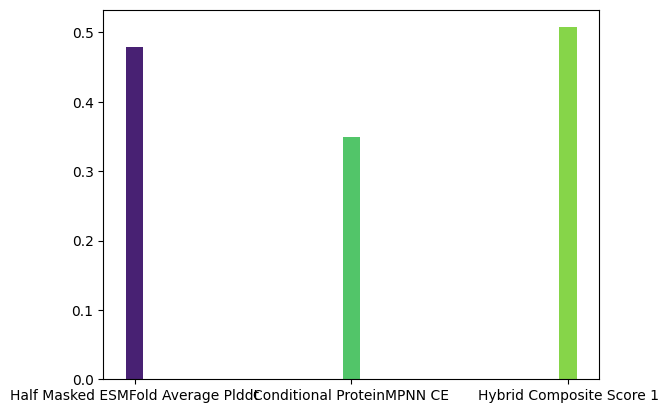

In [462]:
plt.bar('Half Masked ESMFold Average Plddt', data_s[:, 1][4], bar_width, label='Half Masked ESMFold Average Plddt', color =colors[1])
plt.bar('Conditional ProteinMPNN CE', data_s[:, 7][4], bar_width, label='Conditional ProteinMPNN CE', color =colors[8])
plt.bar('Hybrid Composite Score 1', data_s[:, 8][4], bar_width, label='Hybrid Composite Score 1', color =colors[9])

/tmp/ipykernel_1275294/4126931069.py:124: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(np.arange(0, 0.6, 0.1), weight='bold')


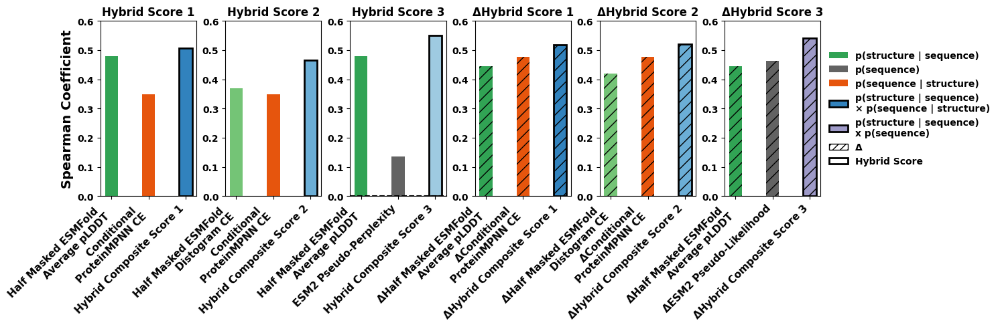

In [464]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import StrMethodFormatter
from matplotlib.patches import Patch

colors = plt.cm.tab20c(np.linspace(0, 1, 20))

bar_width = 0.35  # Width of the bars

# Positions of the bars on the x-axis
bar_positions = np.arange(3)
# Data for plotting
values_set1 = [data_s[:, 1][4], data_s[:, 7][4], data_s[:, 8][4]]
values_set2 = [data_s[:, 13][4], data_s[:, 7][4], data_s[:, 11][4]]
values_set3 = [data_s[:, 1][4], data_s[:, 3][4], data_s[:, 14][4]]

color_set1 =  colors[[8,4,0]]
color_set2 =  colors[[9,4,1]]
color_set3 = colors[[8,16,2]]

labels_set1 = ['Half Masked ESMFold \n Average pLDDT', 'Conditional \n ProteinMPNN CE', 'Hybrid Composite Score 1']
labels_set2 = ['Half Masked ESMFold \n Distogram CE', 'Conditional \n ProteinMPNN CE', 'Hybrid Composite Score 2']
labels_set3 = ['Half Masked ESMFold \n Average pLDDT', 'ESM2 Pseudo-Perplexity', 'Hybrid Composite Score 3']


# Creating subplots
fig, axes = plt.subplots(1, 6, figsize=(15, 5))

# Plotting for the first set of values and labels
for pos, value, label, color in zip(bar_positions, values_set1, labels_set1, color_set1):
    if pos == 2:  # Check if it's the third item
        axes[0].bar(pos, value, bar_width, label=label, color=color, edgecolor='black', linewidth=2)
    else:
        axes[0].bar(pos, value, bar_width, label=label, color=color)

axes[0].set_xticks(bar_positions)
axes[0].set_xticklabels(labels_set1, rotation=45, ha="right", weight = 'bold',  fontsize= 11)
axes[0].set_ylabel('Spearman Coefficient', weight = 'bold', fontsize= 14)
axes[0].set_title('Hybrid Score 1', weight = 'bold')

# Plotting for the second set of values and labels
for pos, value, label, color in zip(bar_positions, values_set2, labels_set2, color_set2):
    if pos == 2:  # Check if it's the third item
        axes[1].bar(pos, value, bar_width, label=label, color=color, edgecolor='black', linewidth=2)
    else:
        axes[1].bar(pos, value, bar_width, label=label, color=color)

axes[1].set_xticks(bar_positions)
axes[1].set_xticklabels(labels_set2, rotation=45, ha="right", weight = 'bold',  fontsize= 11)
axes[1].set_title('Hybrid Score 2', weight = 'bold')

# Mixing colors for the third set
for pos, value, label, color in zip(bar_positions, values_set3, labels_set3, color_set3):
    if pos == 2:  # Check if it's the third item
        axes[2].bar(pos, value, bar_width, label=label, color=color, edgecolor='black', linewidth=2)
    else:
        axes[2].bar(pos, value, bar_width, label=label, color=color)

axes[2].set_xticks(bar_positions)
axes[2].set_xticklabels(labels_set3, rotation=45, ha="right", weight = 'bold',  fontsize= 11)
axes[2].set_title('Hybrid Score 3', weight = 'bold')

axes[2].axhline(color='black', linestyle='--')
# colors = plt.cm.tab20b(np.linspace(0, 1, 20))

bar_width = 0.35  # Width of the bars


bar_positions = np.arange(3)



values_set1 = [dd_s[:, 1][4], dd_s[:, 7][4], dd_s[:, 8][4]]
values_set2 = [dd_s[:, 13][4], dd_s[:, 7][4], dd_s[:, 11][4]]
values_set3 = [dd_s[:, 1][4], dd_s[:, 3][4], dd_s[:, 14][4]]

color_set1 =  colors[[8,4,0]]
color_set2 =  colors[[9,4,1]]
color_set3 = colors[[8,16,13]]

labels_set1 = ['ΔHalf Masked ESMFold \n Average pLDDT', 'ΔConditional \n ProteinMPNN CE', 'ΔHybrid Composite Score 1']
labels_set2 = ['ΔHalf Masked ESMFold \n Distogram CE', 'ΔConditional \n ProteinMPNN CE', 'ΔHybrid Composite Score 2']
labels_set3 = ['ΔHalf Masked ESMFold \n Average pLDDT', 'ΔESM2 Pseudo-Likelihood', 'ΔHybrid Composite Score 3']


# Plotting for the first set of values and labels
for pos, value, label, color in zip(bar_positions, values_set1, labels_set1, color_set1):
    if pos == 2:  # Check if it's the third item
        axes[3].bar(pos, value, bar_width, label=label, color=color, edgecolor='black', linewidth=2, hatch='//')
    else:
        axes[3].bar(pos, value, bar_width, label=label, color=color, hatch='//')

axes[3].set_xticks(bar_positions)
axes[3].set_xticklabels(labels_set1, rotation=45, ha="right", weight = 'bold', fontsize= 11)
# axes[3].set_ylabel('Spearman Coefficient', weight = 'bold', fontsize= 14)
axes[3].set_title('ΔHybrid Score 1', weight = 'bold')

# Plotting for the second set of values and labels
for pos, value, label, color in zip(bar_positions, values_set2, labels_set2, color_set2):
    if pos == 2:  # Check if it's the third item
        axes[4].bar(pos, value, bar_width, label=label, color=color, edgecolor='black', linewidth=2, hatch='//')
    else:
        axes[4].bar(pos, value, bar_width, label=label, color=color, hatch='//')

axes[4].set_xticks(bar_positions)
axes[4].set_xticklabels(labels_set2, rotation=45, ha="right", weight = 'bold',  fontsize= 11)
axes[4].set_title('ΔHybrid Score 2', weight = 'bold')

# Mixing colors for the third set
for pos, value, label, color in zip(bar_positions, values_set3, labels_set3, color_set3):
    if pos == 2:  # Check if it's the third item
        axes[5].bar(pos, value, bar_width, label=label, color=color, edgecolor='black', linewidth=2, hatch='//')
    else:
        axes[5].bar(pos, value, bar_width, label=label, color=color, hatch='//')

axes[5].set_xticks(bar_positions)
axes[5].set_xticklabels(labels_set3, rotation=45, ha="right", weight = 'bold',  fontsize= 11)
axes[5].set_title('ΔHybrid Score 3', weight = 'bold')


# Setting y-axis tick labels to bold
for ax in axes:
    ax.set_ylim([0,0.6])
    ax.set_yticklabels(np.arange(0, 0.6, 0.1), weight='bold')
    ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.1f}'))


# Display the plot


color_set1 =  colors[[8,4,0]]
color_set2 =  colors[[9,4,1]]
color_set3 = colors[[8,16,2]]

labels_set1 = ['Half Masked ESMFold \n Average pLDDT', 'Conditional \n ProteinMPNN CE', 'Hybrid Composite Score 1']
labels_set2 = ['Half Masked ESMFold \n Distogram CE', 'Conditional \n ProteinMPNN CE', 'Hybrid Composite Score 2']
labels_set3 = ['Half Masked ESMFold \n Average pLDDT', 'ESM2 Pseudo-Likelihood', 'Hybrid Composite Score 3']


legend_elements = [Patch(facecolor=colors[8], label='p(structure | sequence)')]
legend_elements += [Patch(facecolor=colors[16], label='p(sequence)')]
legend_elements += [Patch(facecolor=colors[4], label='p(sequence | structure)')]
legend_elements += [Patch(facecolor=colors[0], edgecolor='black',linewidth=2,label='p(structure | sequence)\n× p(sequence | structure)')]
legend_elements += [Patch(facecolor=colors[13],edgecolor='black', linewidth=2,label='p(structure | sequence)\nx p(sequence)')]
legend_elements += [Patch(facecolor='none', edgecolor='black', hatch='///', label='Δ')]
legend_elements += [Patch(facecolor='none', edgecolor='black', linewidth=2, label='Hybrid Score')]
axes[5].legend(handles=legend_elements, frameon=False,loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14, prop={'weight':'bold'})

# Adjust layout to not cut off labels
plt.tight_layout()
plt.subplots_adjust(wspace=0.3)

# plt.savefig('/home/jupyter-yehlin/DMSV2/figures/final_bold_figures/models_combined_figure3_3scores.png',  dpi=300)

plt.show()

/tmp/ipykernel_1275294/3598396971.py:98: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(np.arange(0, 0.6, 0.1), weight='bold')


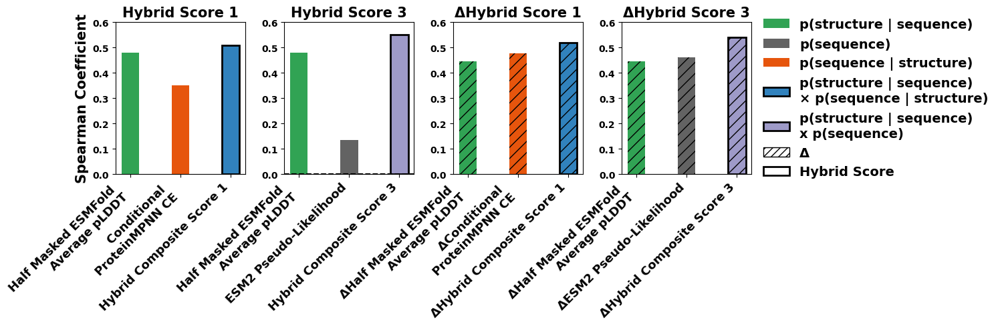

In [467]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import StrMethodFormatter
from matplotlib.patches import Patch

colors = plt.cm.tab20c(np.linspace(0, 1, 20))

bar_width = 0.35  # Width of the bars

# Positions of the bars on the x-axis
bar_positions = np.arange(3)
# Data for plotting
values_set1 = [data_s[:, 1][4], data_s[:, 7][4], data_s[:, 8][4]]
values_set3 = [data_s[:, 1][4], data_s[:, 3][4], data_s[:, 14][4]]

color_set1 =  colors[[8,4,0]]
color_set3 = colors[[8,16,13]]

labels_set1 = ['Half Masked ESMFold \n Average pLDDT', 'Conditional \n ProteinMPNN CE', 'Hybrid Composite Score 1']
labels_set3 = ['Half Masked ESMFold \n Average pLDDT', 'ESM2 Pseudo-Likelihood', 'Hybrid Composite Score 3']


# Creating subplots
fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plotting for the first set of values and labels
for pos, value, label, color in zip(bar_positions, values_set1, labels_set1, color_set1):
    if pos == 2:  # Check if it's the third item
        axes[0].bar(pos, value, bar_width, label=label, color=color, edgecolor='black', linewidth=2)
    else:
        axes[0].bar(pos, value, bar_width, label=label, color=color)

axes[0].set_xticks(bar_positions)
axes[0].set_xticklabels(labels_set1, rotation=45, ha="right", weight = 'bold',  fontsize= 13)
axes[0].set_ylabel('Spearman Coefficient', weight = 'bold', fontsize= 15)
axes[0].set_title('Hybrid Score 1', weight = 'bold', fontsize= 15)


# Mixing colors for the third set
for pos, value, label, color in zip(bar_positions, values_set3, labels_set3, color_set3):
    if pos == 2:  # Check if it's the third item
        axes[1].bar(pos, value, bar_width, label=label, color=color, edgecolor='black', linewidth=2)
    else:
        axes[1].bar(pos, value, bar_width, label=label, color=color)

axes[1].set_xticks(bar_positions)
axes[1].set_xticklabels(labels_set3, rotation=45, ha="right", weight = 'bold',  fontsize= 13)
axes[1].set_title('Hybrid Score 3', weight = 'bold', fontsize= 15)

axes[1].axhline(color='black', linestyle='--')
# colors = plt.cm.tab20b(np.linspace(0, 1, 20))

bar_width = 0.35  # Width of the bars


bar_positions = np.arange(3)



values_set1 = [dd_s[:, 1][4], dd_s[:, 7][4], dd_s[:, 8][4]]
values_set3 = [dd_s[:, 1][4], dd_s[:, 3][4], dd_s[:, 14][4]]

color_set1 =  colors[[8,4,0]]
color_set3 = colors[[8,16,13]]

labels_set1 = ['ΔHalf Masked ESMFold \n Average pLDDT', 'ΔConditional \n ProteinMPNN CE', 'ΔHybrid Composite Score 1']
labels_set3 = ['ΔHalf Masked ESMFold \n Average pLDDT', 'ΔESM2 Pseudo-Likelihood', 'ΔHybrid Composite Score 3']


# Plotting for the first set of values and labels
for pos, value, label, color in zip(bar_positions, values_set1, labels_set1, color_set1):
    if pos == 2:  # Check if it's the third item
        axes[2].bar(pos, value, bar_width, label=label, color=color, edgecolor='black', linewidth=2, hatch='//')
    else:
        axes[2].bar(pos, value, bar_width, label=label, color=color, hatch='//')

axes[2].set_xticks(bar_positions)
axes[2].set_xticklabels(labels_set1, rotation=45, ha="right", weight = 'bold', fontsize= 13)
# axes[3].set_ylabel('Spearman Coefficient', weight = 'bold', fontsize= 14)
axes[2].set_title('ΔHybrid Score 1', weight = 'bold', fontsize= 15)


# Mixing colors for the third set
for pos, value, label, color in zip(bar_positions, values_set3, labels_set3, color_set3):
    if pos == 2:  # Check if it's the third item
        axes[3].bar(pos, value, bar_width, label=label, color=color, edgecolor='black', linewidth=2, hatch='//')
    else:
        axes[3].bar(pos, value, bar_width, label=label, color=color, hatch='//')

axes[3].set_xticks(bar_positions)
axes[3].set_xticklabels(labels_set3, rotation=45, ha="right", weight = 'bold',  fontsize= 13)
axes[3].set_title('ΔHybrid Score 3', weight = 'bold', fontsize= 15)


# Setting y-axis tick labels to bold
for ax in axes:
    ax.set_ylim([0,0.6])
    ax.set_yticklabels(np.arange(0, 0.6, 0.1), weight='bold')
    ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.1f}'))



legend_elements = [Patch(facecolor=colors[8], label='p(structure | sequence)')]
legend_elements += [Patch(facecolor=colors[16], label='p(sequence)')]
legend_elements += [Patch(facecolor=colors[4], label='p(sequence | structure)')]
legend_elements += [Patch(facecolor=colors[0], edgecolor='black',linewidth=2,label='p(structure | sequence)\n× p(sequence | structure)')]
legend_elements += [Patch(facecolor=colors[13],edgecolor='black', linewidth=2,label='p(structure | sequence)\nx p(sequence)')]
legend_elements += [Patch(facecolor='none', edgecolor='black', hatch='///', label='Δ')]
legend_elements += [Patch(facecolor='none', edgecolor='black', linewidth=2, label='Hybrid Score')]
axes[3].legend(handles=legend_elements, frameon=False,loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15, prop={'weight':'bold',  "size": 14})

# Adjust layout to not cut off labels
plt.tight_layout()
plt.subplots_adjust(wspace=0.3)

# plt.savefig('/home/jupyter-yehlin/DMSV2/figures/final_bold_figures/models_combined_figure3_2scores_logESM.png',  dpi=300)

plt.show()

## ddG

In [500]:
import pandas as pd
from scipy.stats import spearmanr
from itertools import combinations

def calculate_spearman_coefficient(merged_df, methods, score, exp_variable):
    # Get all combinations of 2 methods
    combinations_of_methods = list(combinations(methods, 2))

    # Create an empty DataFrame to store concatenated data
    combined_df = pd.DataFrame()

    # Concatenate all combinations into one DataFrame
    for i, (method1, method2) in enumerate(combinations_of_methods):
        # Filter DataFrame for the current combination of methods
        df_method1 = merged_df[merged_df['method'] == method1]
        df_method2 = merged_df[merged_df['method'] == method2]

        # Merge the DataFrames on 'ID' to get pairs of deltaG values for the same ID
        df_merged = pd.merge(df_method1, df_method2, on='ID', suffixes=(f'_{method1}', f'_{method2}'))

        # Rename columns to have consistent names
        df_merged.rename(columns={
            f'{exp_variable}_{method1}': exp_variable,
            f'{exp_variable}_{method2}': f'{exp_variable}_other',
            f'{score}_{method1}': score,
            f'{score}_{method2}': f'{score}_other',
            f'AF_plddt_{method1}': 'AF_plddt',
            f'AF_plddt_{method2}': 'AF_plddt_other',
        }, inplace=True)

        # Calculate the difference of PLDDT values
        df_merged['PLDDT_diff'] = df_merged['AF_plddt'] - df_merged['AF_plddt_other']

        # Concatenate into the combined DataFrame
        combined_df = pd.concat([combined_df, df_merged])
        
    
    # Calculate Spearman correlation coefficient
    spearman_coefficient, _ = spearmanr(
        combined_df[exp_variable] - combined_df[f'{exp_variable}_other'],
        combined_df[score] - combined_df[f'{score}_other'],
        nan_policy='omit'
    )
    

    return spearman_coefficient, combined_df


def calculate_spearman_coefficients(merged_df, methods, columns, exp_variable):
    spearman_coefficients = []
    for column in columns:
        result, output_df= calculate_spearman_coefficient(merged_df, methods, column, exp_variable)
        spearman_coefficients.append(result)
    return spearman_coefficients, output_df


In [501]:

methods = ['TrROS', 'TrMRF', 'TrROS_Hall', 'JUSTAS']
columns_to_calculate = [
    'Full Seq PLDDT',
    'Half Masked ESMFold Average Plddt',
    'Max Half Masked ESMFold Plddt',
    'log ESM Score',
    'AF_plddt',
    'inter_pae',
    'unconditional_CE',
    'conditional_CE',
    'Hybrid Composite Score 1',
    'log_CE_full',
    'CE_full',
    'Hybrid Composite Score 2',
    'log_CE_avg_mask',
    'CE_avg_mask',
    'Hybrid Composite Score 3',
]

deltaG_t_s, _= calculate_spearman_coefficients(merged_df, methods, columns_to_calculate, 'deltaG_t')
deltaG_c_s, _ = calculate_spearman_coefficients(merged_df, methods, columns_to_calculate, 'deltaG_c')
delta_G_s, _ = calculate_spearman_coefficients(merged_df, methods, columns_to_calculate, 'deltaG')
log10_K50_t_s, _ = calculate_spearman_coefficients(merged_df, methods, columns_to_calculate, 'log10_K50_t')
log10_K50_c_s, _ = calculate_spearman_coefficients(merged_df, methods, columns_to_calculate, 'log10_K50_c')

In [502]:
id_counts = merged_df['ID'].value_counts().to_dict()

In [314]:
merged_df.keys()

Index(['name', 'sequence', 'Full Seq PLDDT', 'Half Masked ESMFold Plddt',
       'Max Half Masked ESMFold Plddt', 'Half Masked ESMFold Average Plddt',
       'ESM Score', 'AF_plddt', 'inter_pae', 'log10_K50_t', 'log10_K50_t_95CI',
       'log10_K50_c', 'log10_K50_c_95CI', 'deltaG_t', 'deltaG_t_95CI',
       'deltaG_c', 'deltaG_c_95CI', 'deltaG', 'deltaG_95CI',
       'unconditional_CE', 'unconditional_softmax_CE', 'conditional_CE',
       'conditional_softmax_CE', 'Hybrid Composite Score', 'log_CE_mask',
       'CE_mask', 'PLDDT_mask', 'PTM_mask', 'log_CE_full', 'CE_full',
       'PLDDT_full', 'PTM_full', 'ID', 'method', 'Hybrid Composite Score 1',
       'log_CE_avg_mask', 'CE_avg_mask', 'Hybrid Composite Score 2',
       'Hybrid Composite Score 3', 'Hybrid Composite Score 4'],
      dtype='object')

0.518103483857924
0.5210006851059009
0.5193960137885826
0.4773009840938161


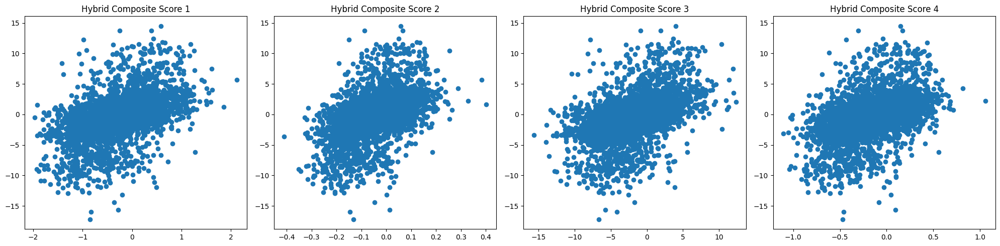

In [178]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 5))  
# First plot
result, output_df = calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score 1', 'deltaG')
plt.subplot(1, 4, 1)  # 1 row, 3 columns, first plot
plt.scatter(output_df['Hybrid Composite Score 1'] - output_df['Hybrid Composite Score 1_other'], output_df['deltaG'] - output_df['deltaG_other'])
plt.title('Hybrid Composite Score 1')
print(result)

# Second plot
result, output_df = calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score 2', 'deltaG')
plt.subplot(1, 4, 2)  # 1 row, 3 columns, second plot
plt.scatter(output_df['Hybrid Composite Score 2'] - output_df['Hybrid Composite Score 2_other'], output_df['deltaG'] - output_df['deltaG_other'])
plt.title('Hybrid Composite Score 2')
print(result)

# Third plot
result, output_df = calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score 3', 'deltaG')
plt.subplot(1, 4, 3)  # 1 row, 3 columns, third plot
plt.scatter(output_df['Hybrid Composite Score 3'] - output_df['Hybrid Composite Score 3_other'], output_df['deltaG'] - output_df['deltaG_other'])
plt.title('Hybrid Composite Score 3')
print(result)


result, output_df = calculate_spearman_coefficient(merged_df, methods, 'Hybrid Composite Score 4', 'deltaG')
plt.subplot(1, 4, 4)  # 1 row, 3 columns, third plot
plt.scatter(output_df['Hybrid Composite Score 4'] - output_df['Hybrid Composite Score 4_other'], output_df['deltaG'] - output_df['deltaG_other'])
plt.title('Hybrid Composite Score 4')
print(result)

plt.tight_layout()  # Adjust the layout
plt.show()  # Display all plots


In [ ]:
# merged_df['Hybrid Composite Score_2'] = merged_df['ESM Score']/merged_df['conditional_CE']

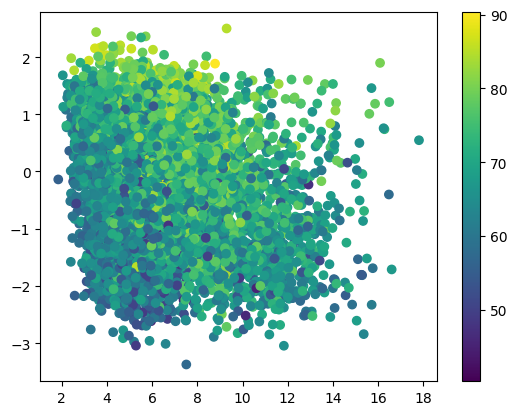

In [ ]:
result, output_df= calculate_spearman_coefficient(merged_df, methods, 'ESM Score',  'log10_K50_c')
plt.scatter(merged_df['ESM Score'] , merged_df['log10_K50_c'], c= merged_df['Half Masked ESMFold Average Plddt'])
plt.colorbar()

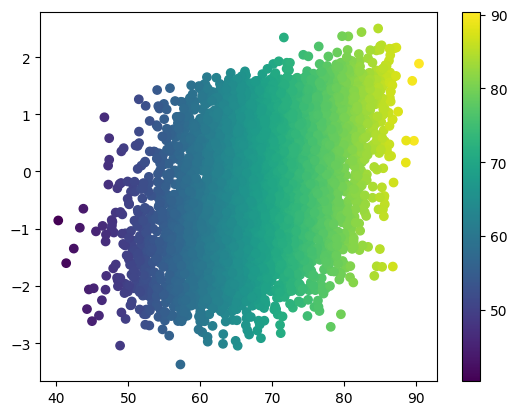

In [ ]:
plt.scatter(merged_df['Half Masked ESMFold Average Plddt'] , merged_df['log10_K50_c'], c= merged_df['Half Masked ESMFold Average Plddt'])
plt.colorbar()

Spearman Correlation Coefficient: 0.42781552123851624


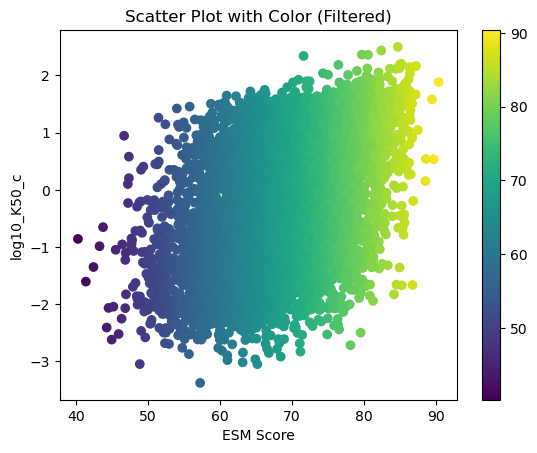

In [207]:
import matplotlib.pyplot as plt

# Filter the DataFrame based on the condition
filtered_df = merged_df[merged_df['Half Masked ESMFold Average Plddt'] > 70]


# Scatter plot with color based on 'Half Masked ESMFold Average Plddt'
plt.scatter(merged_df['Half Masked ESMFold Average Plddt'], merged_df['log10_K50_c'], c=merged_df['Half Masked ESMFold Average Plddt'])
plt.colorbar()

# Adding labels and title
plt.xlabel('ESM Score')
plt.ylabel('log10_K50_c')
plt.title('Scatter Plot with Color (Filtered)')

# Show the plot

spearman_coefficient, _ = spearmanr(merged_df['Half Masked ESMFold Average Plddt'], merged_df['log10_K50_c'])

# Print the result
print(f"Spearman Correlation Coefficient: {spearman_coefficient}")


plt.show()

In [473]:
import numpy as np
import matplotlib.pyplot as plt

num_groups = 5
bar_width = 0.08
index = np.arange(num_groups)

# Rainbow colormap
dd_s = [log10_K50_t_s, log10_K50_c_s, deltaG_t_s, deltaG_c_s, delta_G_s]
dd_s = np.abs(np.array(dd_s))

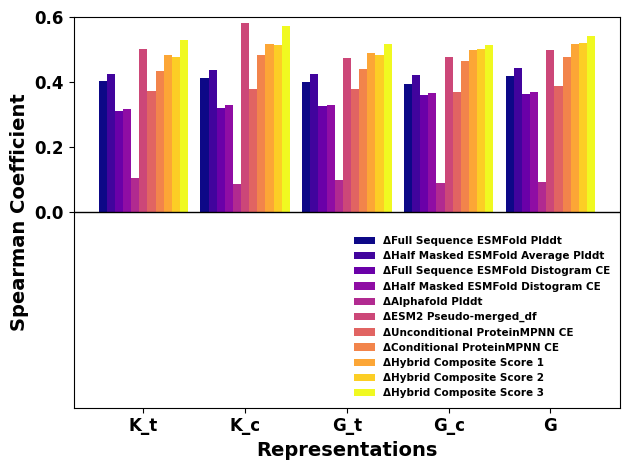

In [514]:

# colors = plt.cm.rainbow(np.linspace(1, 0, 9))
colors = plt.cm.plasma(np.linspace(0, 1, 11))
# colors[-1] = [0.5, 0.5, 0.5, 1.0]

# Create grouped bar graph with pastel colors
plt.bar(index - 5 * bar_width, dd_s[:, 0], bar_width, label='ΔFull Sequence ESMFold Plddt', color =colors[0])
plt.bar(index - 4 * bar_width, dd_s[:, 1], bar_width, label='ΔHalf Masked ESMFold Average Plddt', color =colors[1])
# plt.bar(index - 2*bar_width, dd_s[:, 2], bar_width, label='ΔMax Half Masked ESMFold Plddt', color =colors[2])
plt.bar(index -3*bar_width, data_s[:, 10], bar_width, label='ΔFull Sequence ESMFold Distogram CE', color =colors[2])
plt.bar(index - 2*bar_width, data_s[:, 13], bar_width, label='ΔHalf Masked ESMFold Distogram CE', color =colors[3])
plt.bar(index-bar_width, dd_s[:, 4], bar_width, label='ΔAlphafold Plddt', color =colors[4])
plt.bar(index, dd_s[:, 3], bar_width, label='ΔESM2 Pseudo-merged_df', color =colors[5])
plt.bar(index+1*bar_width, dd_s[:, 6], bar_width, label='ΔUnconditional ProteinMPNN CE', color =colors[6])
plt.bar(index + 2*bar_width, dd_s[:, 7], bar_width, label='ΔConditional ProteinMPNN CE', color =colors[7])
plt.bar(index + 3*bar_width, dd_s[:, 8], bar_width, label='ΔHybrid Composite Score 1', color =colors[8])
plt.bar(index + 4*bar_width, dd_s[:, 11], bar_width, label='ΔHybrid Composite Score 2', color =colors[9])
plt.bar(index + 5*bar_width, dd_s[:, 14], bar_width, label='ΔHybrid Composite Score 3', color =colors[10])

plt.axhline(y=0, color='black', linestyle='-', linewidth=1)

# Customize the plot


# Customize the plot
plt.xlabel('Representations',fontsize = 14, weight= 'bold')
plt.ylabel('Spearman Coefficient' , fontsize = 14, weight= 'bold')
plt.ylim([-0.6, 0.6])
# plt.title('Grouped Bar Graph for Different Stability Factors')
plt.xticks(index, ['K_t', 'K_c', 'G_t', 'G_c', 'G'], fontsize = 12, weight = 'bold')
plt.yticks(np.arange(0, 0.65, 0.2), fontsize=12, weight='bold')  # Adjust the step as needed

legend = plt.legend(loc='lower right', fontsize= 7.5, frameon=False)
for text in legend.get_texts():
    text.set_weight('bold')  # Make legend text bold

plt.tight_layout()  
plt.savefig('/home/jupyter-yehlin/DMSV2/figures/final_bold_figures/models_delta_spearman_coefficient_plasma_logESM.png',  dpi=300)
# Show the plot

plt.show()

In [179]:
pwd

'/home/jupyter-yehlin/DMSV2/dataset_final/ESMFold_dist'

## 1-1 Comparision

In [193]:
from scipy.stats import pearsonr, spearmanr
import matplotlib.pyplot as plt



def scatter_and_correlation_color_experiment_datapoint(ax, df, x_column, y_column, label_x, label_y, color_column, xlim=None, ylim=None, colorbar=False, show_y_label= False):
    # Drop rows with NaN values in the specified columns
    df_no_nan = df[[x_column, y_column, color_column]].dropna()

    sc = ax.scatter(df_no_nan[x_column].tolist(), df_no_nan[y_column].tolist(), c=df_no_nan[color_column], cmap='bwr', marker='o', alpha=0.5, s=35)
    # ax.set_title(f'{label_x} \n vs \n {label_y}')
                                              
    ax.set_xlabel(label_x, fontsize=14, weight= 'bold')
    if show_y_label:
        ax.set_ylabel(label_y, fontsize=14, weight= 'bold')

    # Customize xlim and ylim if provided
    if xlim is not None:
        ax.set_xlim(xlim)
    if ylim is not None:
        ax.set_ylim(ylim)

    # Calculate Pearson correlation coefficient
    pearson_coefficient, _ = pearsonr(df_no_nan[x_column], df_no_nan[y_column])

    # Calculate Spearman rank correlation coefficient
    spearman_coefficient, _ = spearmanr(df_no_nan[x_column], df_no_nan[y_column])

    # Add Pearson and Spearman correlation coefficients to the plot
    # ax.text(0.5, 0.95, f"Pearson Coeff: {pearson_coefficient:.2f}", transform=ax.transAxes,
    #         horizontalalignment='center', verticalalignment='top', fontsize=16, weight= 'bold')
    ax.text(0.5, 0.90, f"Spearman Coeff: {spearman_coefficient:.2f}", transform=ax.transAxes,
            horizontalalignment='center', verticalalignment='top', fontsize=14, weight= 'bold')
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_xticklabels():
        label.set_fontweight('bold')
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')
    # Add colorbar
    if colorbar:
        cbar = plt.colorbar(sc, ax=ax, label='ΔG')

    return pearson_coefficient, spearman_coefficient

def plot_computation_vs_computation(ylabel ='log10_K50_t', save_dir=''):
    
    fig, axs = plt.subplots(2, 6, figsize=(20, 7), dpi=200)
    axs = axs.flatten()

    # Example usage for each subplot with customized xlim and ylim
    p1,s1=scatter_and_correlation_color_experiment_datapoint(axs[0], merged_df, 'Half Masked ESMFold Average Plddt', ylabel, 'Half Masked \n ESMFold Average Plddt', ylabel, 'deltaG', show_y_label=True)
    p2,s2=scatter_and_correlation_color_experiment_datapoint(axs[1], merged_df, 'CE_full', ylabel, 'Full Sequence \n ESMFold Distogram CE', ylabel, 'deltaG')
    p3,s3=scatter_and_correlation_color_experiment_datapoint(axs[2], merged_df, 'CE_avg_mask', ylabel, 'Half Masked \n ESMFold  Distogram CE', ylabel, 'deltaG')
    p4,s4=scatter_and_correlation_color_experiment_datapoint(axs[3], merged_df, 'ESM Score', ylabel, 'ESM Score', ylabel, 'deltaG')
    p5,s5=scatter_and_correlation_color_experiment_datapoint(axs[4], merged_df, 'AF_plddt', ylabel, 'AF-Plddt', ylabel, 'deltaG')
    p6,s6=scatter_and_correlation_color_experiment_datapoint(axs[5], merged_df, 'inter_pae',ylabel, 'Inter-PAE', ylabel, 'deltaG', show_y_label=True)
    p7,s7=scatter_and_correlation_color_experiment_datapoint(axs[6], merged_df, 'unconditional_CE', ylabel, 'Unconditional \n ProteinMPNN CE', ylabel, 'deltaG')
    p8,s8=scatter_and_correlation_color_experiment_datapoint(axs[7], merged_df, 'conditional_CE', ylabel, 'Conditional \n ProteinMPNN CE', ylabel, 'deltaG')
    p9,s9=scatter_and_correlation_color_experiment_datapoint(axs[8], merged_df, 'Hybrid Composite Score 1', ylabel, 'Hybrid Composite Score 1', ylabel, 'deltaG')
    p10,s10=scatter_and_correlation_color_experiment_datapoint(axs[9], merged_df, 'Hybrid Composite Score 2', ylabel, 'Hybrid Composite Score 2', ylabel, 'deltaG')
    p11,s11=scatter_and_correlation_color_experiment_datapoint(axs[10], merged_df, 'Hybrid Composite Score 3', ylabel, 'Hybrid Composite Score 3', ylabel, 'deltaG')

    # Adjust layout to prevent clipping of titles
    plt.tight_layout()

    
    plt.savefig(save_dir, dpi=300)
    
    plt.show()


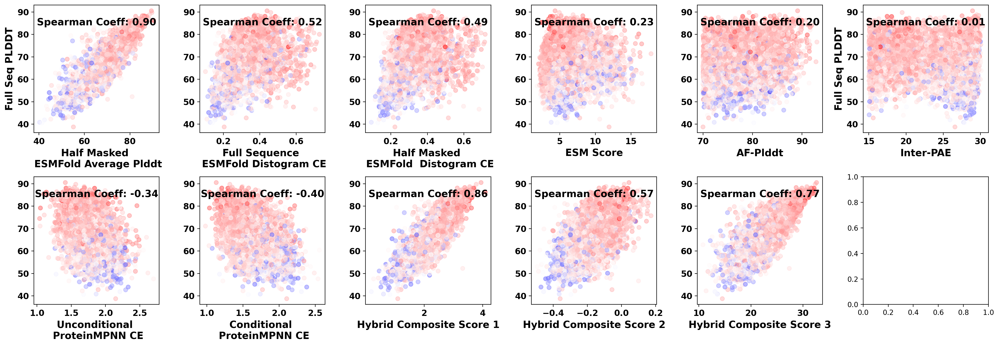

In [194]:
plot_computation_vs_computation('Full Seq PLDDT', '/home/jupyter-yehlin/DMSV2/figures/final_bold_figures/one_to_one_model_correlation_figure_2.png')